# Neccessary Imports and Data Loading

In [1]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [2]:
data_path = "/content/drive/MyDrive/Densenet121/dataset"

In [3]:
#importing required libraries and assigning a alias
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import seaborn as sns
from PIL import Image
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import load_model
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix
from sklearn.metrics import confusion_matrix, roc_curve, auc, classification_report
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import StratifiedKFold

# Hyper-Parameters and Cleaning

In [4]:
# Defining hyperparameters to be used during the model build
batch_size = 32 #allocating a batch
img_height = 128  #image height
img_width = 128  #image width
dropout_rate = 0.1  #rate for droput
n_channels=3  #Number of RGB channels in the image
# Define the input shape of your images
input_shape = (img_width, img_height, n_channels)

In [5]:
# Initializing variable to store total number of images to be printed
total_images = 0

# Iterating over the directory and its subdirectories
for root, dirs, files in os.walk(data_path):
    # Counting the number of files in each directory by searching in the length of the file
    num_files = len(files)
    # Adding the number of files to the total_images variable
    total_images += num_files

# Printing the total number of images
print("Total number of images:", total_images)


Total number of images: 8417


In [6]:
# Counting images per class
classes = os.listdir(data_path) #fetching the list of class names
images_per_class = {} #initializing an empty directory
for class_name in classes: #using for loop to iterate in class name
    class_path = os.path.join(data_path, class_name) #full path to the class names
    if os.path.isdir(class_path): #condition to be fullfilled for loop to iterate
        images_per_class[class_name] = len(os.listdir(class_path)) #counting the number of files in each classes
print("Total number of images per classes:", images_per_class)

Total number of images per classes: {'6': 369, '5': 506, '8': 893, '2': 261, '13': 409, '12': 173, '7': 834, '9': 553, '3': 1053, '4': 504, '1': 487, '0': 1115, '10': 856, '11': 404}


This code focuses on counting the number of images per class within a specified directory structure It checks whether each path corresponds to a valid directory using os.path.isdir(class_path). If the condition is met, the script counts the number of images in that class by evaluating the length of the list obtained from os.listdir(class_path). The final result is a dictionary, images_per_class, containing the total number of images for each class.







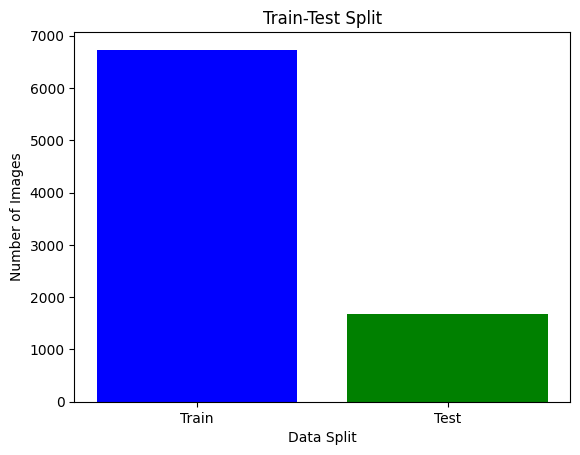

In [7]:
import matplotlib.pyplot as plt

# Total number of images
total_images = 8417

# Define the train-test split ratio
train_ratio = 0.8
test_ratio = 1 - train_ratio

# Calculate the number of images for training and testing
train_size = int(train_ratio * total_images)
test_size = total_images - train_size

# Create labels
labels = ['Train', 'Test']

# Create sizes
sizes = [train_size, test_size]

# Create bars
plt.bar(labels, sizes, color=['blue', 'green'])

# Add title and labels
plt.title('Train-Test Split')
plt.xlabel('Data Split')
plt.ylabel('Number of Images')

# Show the plot
plt.show()


# Data Augumentation

In [8]:
# Define the ImageDataGenerator for the training data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range= 30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Create a data generator for the training dataset
train_ds = train_datagen.flow_from_directory(
    directory=data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)


Found 6741 images belonging to 14 classes.


This code snippet is setting up an ImageDataGenerator for the training data in a deep learning model, often used for image classification tasks. The ImageDataGenerator from the Keras library is employed to dynamically augment the training dataset during the model training phase. The configurations include rescaling the pixel values to a range between 0 and 1, designating 20% of the data for Test, and applying various data augmentation techniques such as rotation, width and height shifting, shear transformations, and horizontal flipping. These augmentations help enhance the diversity of the training set, potentially improving the model's ability to generalize to unseen data. The flow_from_directory method is then utilized to create a data generator (train_ds) that loads images from a specified directory (data_path), resizes them to a given height and width, and organizes them into batches for training. The generator is set to operate on the training subset based on the specified Test split, and the images are assumed to belong to different classes represented as categorical labels. Overall, this code prepares a versatile and augmented dataset for training a deep learning model on image classification tasks.






In [ ]:
# Define the ImageDataGenerator for the training data
augmentation_factor = 3  # Increase data by 3 times
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.3,
    rotation_range= 30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Create a data generator for the training dataset
train_ds = train_datagen.flow_from_directory(
    directory=data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    interpolation='nearest',
    shuffle=True
)

# Calculate the new number of data samples
new_data_count = len(train_ds) * augmentation_factor


Found 5900 images belonging to 14 classes.


In [ ]:
import os

# Get the list of classes
classes = os.listdir(data_path)
class_counts = {c: len(os.listdir(os.path.join(data_path, c))) for c in classes}

# Calculate the total number of data samples
total_original_samples = sum(class_counts.values())
total_new_samples = total_original_samples * augmentation_factor


# Calculate the new number of data samples for each class
new_class_counts = {c: count * augmentation_factor for c, count in class_counts.items()}

# Print the new number of data samples for each class
for c, count in new_class_counts.items():
    print(f"New number of data samples for class {c}: {count}")


New number of data samples for class 6: 1107
New number of data samples for class 5: 1518
New number of data samples for class 8: 2679
New number of data samples for class 2: 783
New number of data samples for class 13: 1227
New number of data samples for class 12: 519
New number of data samples for class 7: 2502
New number of data samples for class 9: 1659
New number of data samples for class 3: 3159
New number of data samples for class 4: 1512
New number of data samples for class 1: 1461
New number of data samples for class 0: 3345
New number of data samples for class 10: 2568
New number of data samples for class 11: 1212


In [ ]:
print("Total number of new data samples after augmentation:", total_new_samples)

Total number of new data samples after augmentation: 25251


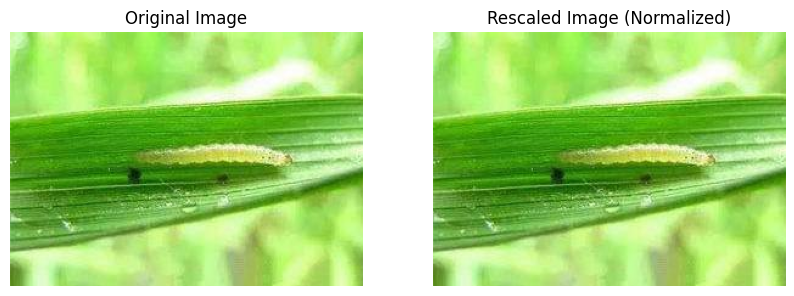

In [ ]:

# Load an example image
img_path = "/content/drive/MyDrive/Densenet121/dataset/0/00080.jpg"
example_img = plt.imread(img_path)

# Rescale the image pixel values
rescaled_image = example_img / 255.0
# Plot both the original and rescaled images side by side
plt.figure(figsize=(10, 5))

# Plot the original image
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(example_img)
plt.axis('off')

# Plot the rescaled image
plt.subplot(1, 2, 2)
plt.title("Rescaled Image (Normalized)")
plt.imshow(rescaled_image)
plt.axis('off')

plt.show()


<ipython-input-50-8b9bba5eb3a0>:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  example_img = imageio.imread(img_path)


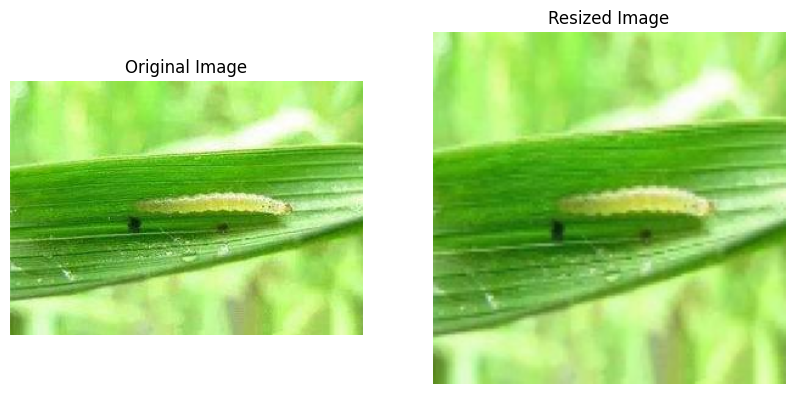

In [ ]:
import matplotlib.pyplot as plt
from skimage.transform import resize
import imageio

# Load an example image
img_path = "/content/drive/MyDrive/Densenet121/dataset/0/00080.jpg"
example_img = imageio.imread(img_path)

# Define the target size for resizing
target_size = (img_height, img_width)  # New dimensions for the image (width, height)

# Resize the image
resized_image = resize(example_img, target_size, anti_aliasing=True)

# Plot both the original and resized images side by side
plt.figure(figsize=(10, 5))

# Plot the original image
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(example_img)
plt.axis('off')

# Plot the resized image
plt.subplot(1, 2, 2)
plt.title("Resized Image")
plt.imshow(resized_image)
plt.axis('off')

plt.show()


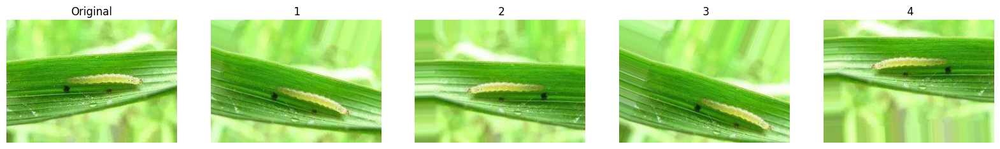

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Define your ImageDataGenerator with augmentation parameters
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.3,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Load the sample image
img_path = "/content/drive/MyDrive/Densenet121/dataset/0/00080.jpg"
img = plt.imread(img_path)

# Reshape the image for the flow method
img = img.reshape((1,) + img.shape)

# Generate augmented images
aug_iter = train_datagen.flow(img, batch_size=1)

# Get augmented images and display
n_augmented_images = 4  # Number of augmented images to generate and visualize
fig, ax = plt.subplots(nrows=1, ncols=n_augmented_images + 1, figsize=(20, 4))

# Plot original image
ax[0].imshow(img[0])
ax[0].set_title('Original')
ax[0].axis('off')

# Plot augmented images
for i in range(n_augmented_images):
    augmented_img = next(aug_iter)[0]  # Generate next augmented image
    ax[i+1].imshow(augmented_img)
    ax[i+1].set_title(' {}'.format(i+1))
    ax[i+1].axis('off')

plt.show()


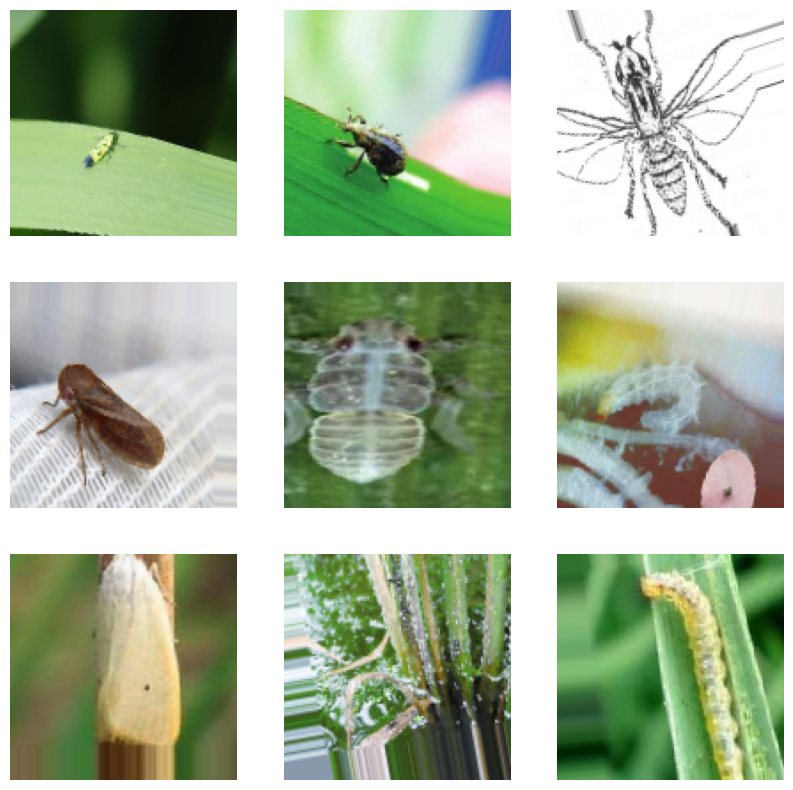

In [ ]:

# Get a batch of augmented images
augmented_images, _ = next(train_ds)

# Display the augmented images
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[i])
    plt.axis("off")
plt.show()


Found 8417 images belonging to 14 classes.


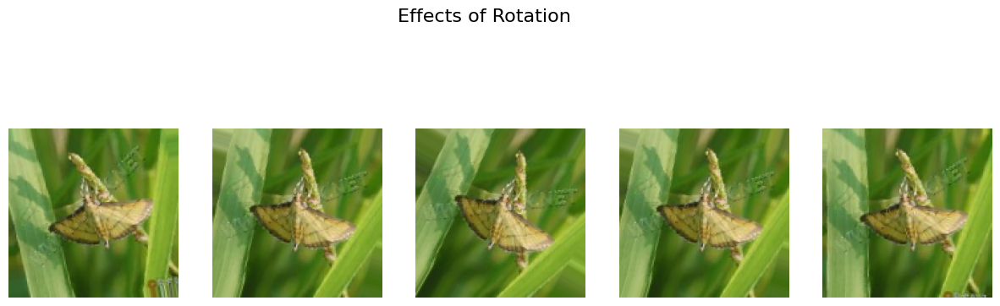

Found 8417 images belonging to 14 classes.


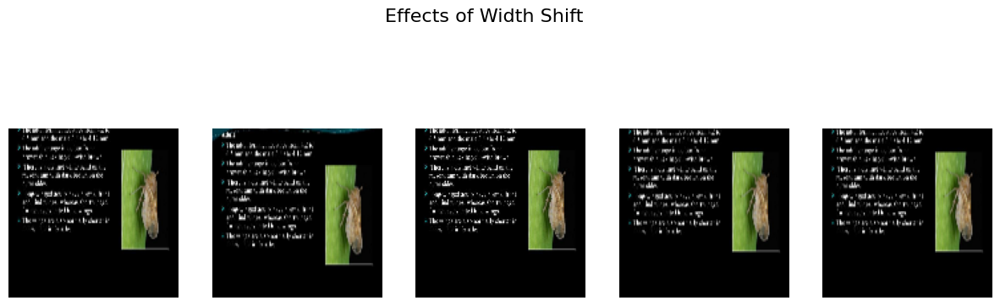

Found 8417 images belonging to 14 classes.


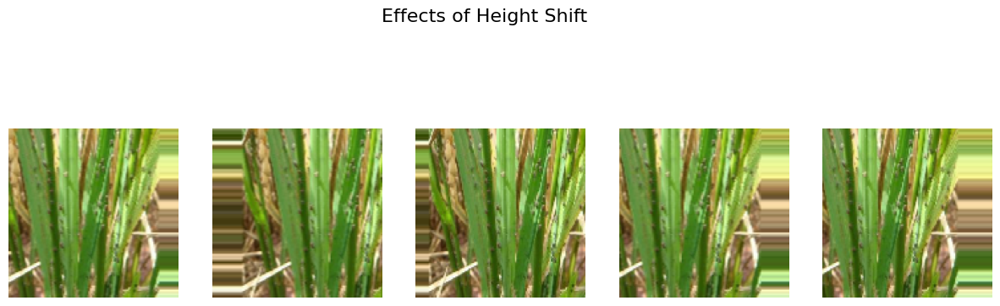

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Function to visualize augmented images
def visualize_augmentation(generator, title, n_examples=5):
    # Generate n_examples augmented images
    augmented_images = [generator[0][0][0] for _ in range(n_examples)]

    # Plot the augmented images
    fig, axes = plt.subplots(1, n_examples, figsize=(15, 5))
    fig.suptitle(title, fontsize=16)

    for i, image in enumerate(augmented_images):
        axes[i].imshow(image)
        axes[i].axis('off')

    plt.show()

# Visualize the effects of rotation
rotated_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30
)
rotated_ds = rotated_datagen.flow_from_directory(
    directory=data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    interpolation='nearest',
    shuffle=True
)
visualize_augmentation(rotated_ds, title="Effects of Rotation")

# Visualize the effects of width shift
width_shift_datagen = ImageDataGenerator(
    rescale=1./255,
    width_shift_range=0.2
)
width_shift_ds = width_shift_datagen.flow_from_directory(
    directory=data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    interpolation='nearest',
    shuffle=True
)
visualize_augmentation(width_shift_ds, title="Effects of Width Shift")

# Visualize the effects of height shift
height_shift_datagen = ImageDataGenerator(
    rescale=1./255,
    height_shift_range=0.2
)
height_shift_ds = height_shift_datagen.flow_from_directory(
    directory=data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    interpolation='nearest',
    shuffle=True
)
visualize_augmentation(height_shift_ds, title="Effects of Height Shift")


Found 8417 images belonging to 14 classes.
Found 8417 images belonging to 14 classes.
Found 8417 images belonging to 14 classes.


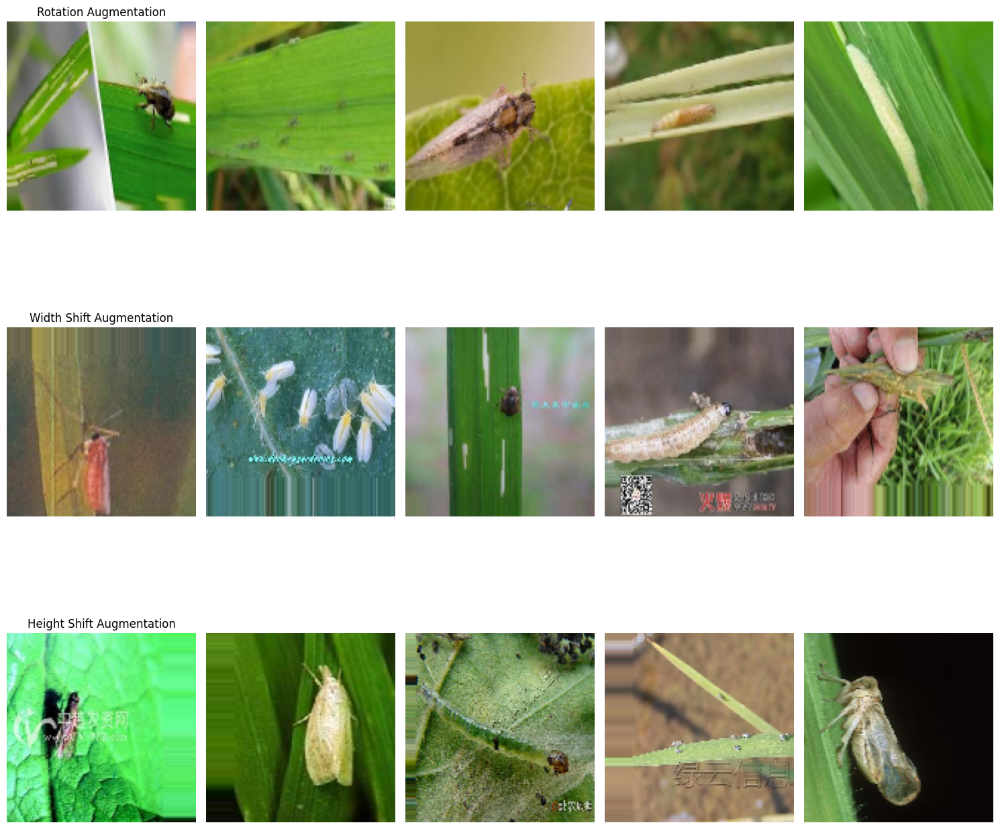

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Function to visualize augmented images
def visualize_augmentation(generators, titles, n_examples=5):
    # Plot the augmented images
    fig, axes = plt.subplots(len(generators), n_examples, figsize=(15, len(generators) * 5))

    for i, generator in enumerate(generators):
        for j in range(n_examples):
            augmented_images, _ = next(generator)
            axes[i, j].imshow(augmented_images[0])
            axes[i, j].axis('off')
        axes[i, 0].set_title(titles[i])

    plt.tight_layout()
    plt.show()

# Define augmentation parameters
augmentation_parameters = [
    {"type": "rotation", "range": 30},
    {"type": "width_shift", "range": 0.2},
    {"type": "height_shift", "range": 0.2}
]

# Create ImageDataGenerator for each augmentation type
data_generators = []
for params in augmentation_parameters:
    if params["type"] == "rotation":
        datagen = ImageDataGenerator(rescale=1./255, rotation_range=params["range"])
    elif params["type"] == "width_shift":
        datagen = ImageDataGenerator(rescale=1./255, width_shift_range=params["range"])
    elif params["type"] == "height_shift":
        datagen = ImageDataGenerator(rescale=1./255, height_shift_range=params["range"])
    else:
        raise ValueError("Invalid augmentation type")

    data_generators.append(datagen.flow_from_directory(
        directory=data_path,
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode='categorical',
        subset='training',
        interpolation='nearest',
        shuffle=True
    ))

# Visualize the effects of augmentation
titles = [params["type"].replace("_", " ").title() + " Augmentation" for params in augmentation_parameters]
visualize_augmentation(data_generators, titles, n_examples=5)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define image data generator for validation patches
val_patch_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

# Patch dimensions
patch_height = 16
patch_width = 16

# Load data for validation patches
val_patch_ds = val_patch_datagen.flow_from_directory(
    directory=data_path,
    target_size=(patch_height, patch_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'  # Use 'validation' subset for validation data
)


Found 1676 images belonging to 14 classes.


In [9]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define image data generator for validation patches
val_patch_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

# Patch dimensions
patch_height = 4
patch_width = 4

# Load data for validation patches
val_patch_ds = val_patch_datagen.flow_from_directory(
    directory=data_path,
    target_size=(patch_height, patch_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'  # Use 'validation' subset for validation data
)


Found 1676 images belonging to 14 classes.


In [10]:
# Print information about the generated dataset
print("Patch-wise Test Dataset Information:")
print("===========================================")
print(f"Patch Height: {patch_height}")
print(f"Patch Width: {patch_width}")
print(f"Batch Size: {batch_size}")
print(f"Number of Classes: {val_patch_ds.num_classes}")
print(f"Number of Images in Test Subset: {val_patch_ds.samples}")
print(f"Number of patches: {len(val_patch_ds)}")

# Display a sample batch shape
sample_batch = val_patch_ds.next()
print("\nSample Batch Shape:")
print(sample_batch[0].shape, sample_batch[1].shape)  # Input images, one-hot encoded labels


Patch-wise Test Dataset Information:
Patch Height: 4
Patch Width: 4
Batch Size: 32
Number of Classes: 14
Number of Images in Test Subset: 1676
Number of patches: 53

Sample Batch Shape:
(32, 4, 4, 3) (32, 14)


In [11]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define image data generator for validation patches
val_patch_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

# Patch dimensions
patch_height = 8
patch_width = 8

# Load data for validation patches
val_patch_ds = val_patch_datagen.flow_from_directory(
    directory=data_path,
    target_size=(patch_height, patch_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'  # Use 'validation' subset for validation data
)


Found 1676 images belonging to 14 classes.


This code segment is responsible for configuring and creating a Test data generator, specifically designed for generating image patches, which can be useful in tasks like object detection or segmentation. Firstly, an ImageDataGenerator is instantiated for the Test data (val_patch_datagen). The generator is configured to rescale the pixel values of the images to a range between 0 and 1.  The generator is configured to operate in the 'categorical' class mode, indicating that the image labels are represented as one-hot encoded vectors. The subset parameter is set to 'Test', designating that this generator is intended for the Test subset of the dataset. Overall, this code establishes a Test data generator tailored for generating patches, which can be utilized in the evaluation phase of a deep learning model.



***Patch Wise Information ***

In the given code snippet, patch-wise Test is established using the Keras ImageDataGenerator to create a Test data generator (val_patch_ds). The key aspect of patch-wise Test lies in the configuration of the generator, particularly the setting of the target_size parameter, which defines the dimensions of the image patches. In this case, the target_size is specified as (64, 64), indicating that the model will be evaluated on smaller patches with dimensions of 64x64 pixels during the Test phase.
The advantage of patch-wise Test lies in its ability to offer a more fine-grained assessment of the model's performance. Here are some advantages of patch-wise Test:

Localization of Model Performance:

Patch-wise Test allows for the localization of model performance, providing insights into how well the model identifies and classifies specific regions or features within an image. This can be crucial for tasks such as object detection or segmentation where understanding the model's behavior at a more localized level is essential.
Robustness Testing:

By evaluating the model on smaller patches, patch-wise Test can reveal the model's robustness to variations in local features. It helps identify how well the model generalizes to different patterns within the data, potentially leading to improvements in its overall performance.
Increased Sensitivity to Localized Patterns:

Patch-wise Test increases the sensitivity of performance metrics to local variations within the images. This sensitivity can help identify specific challenges or strengths of the model in recognizing smaller, localized patterns that might be overlooked in a holistic image-level evaluation.
Task-Specific Evaluation:

For certain tasks where the importance of specific regions within an image is emphasized, patch-wise Test provides a more tailored evaluation strategy. For instance, in medical image analysis, focusing on specific regions of interest can be crucial for accurate diagnosis.
Interpretability and Debugging:

When faced with misclassifications or unexpected model behaviors, patch-wise Test facilitates the localization of issues. It aids in the interpretability of model predictions and can guide debugging efforts by pinpointing problematic regions within the images.

In [ ]:
# Print information about the generated dataset
print("Patch-wise Test Dataset Information:")
print("===========================================")
print(f"Patch Height: {patch_height}")
print(f"Patch Width: {patch_width}")
print(f"Batch Size: {batch_size}")
print(f"Number of Classes: {val_patch_ds.num_classes}")
print(f"Number of Images in Test Subset: {val_patch_ds.samples}")
print(f"Number of patches: {len(val_patch_ds)}")

# Display a sample batch shape
sample_batch = val_patch_ds.next()
print("\nSample Batch Shape:")
print(sample_batch[0].shape, sample_batch[1].shape)  # Input images, one-hot encoded labels


Patch-wise Validation Dataset Information:
Patch Height: 16
Patch Width: 16
Batch Size: 32
Number of Classes: 14
Number of Images in Validation Subset: 835
Number of patches: 27

Sample Batch Shape:
(32, 16, 16, 3) (32, 14)


# Visualization

In [ ]:
# Printing out number of Classes
indices = train_ds.class_indices  # Getting the mapping of class names to indices
class_names = list(indices.keys())  # Extracting class names from the mapping
print(class_names)

['0', '1', '10', '11', '12', '13', '2', '3', '4', '5', '6', '7', '8', '9']


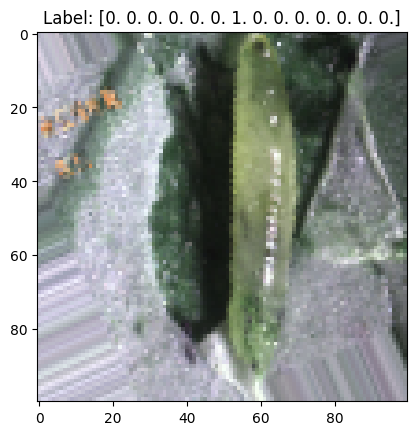

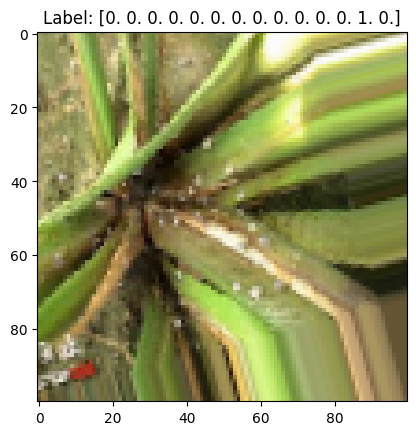

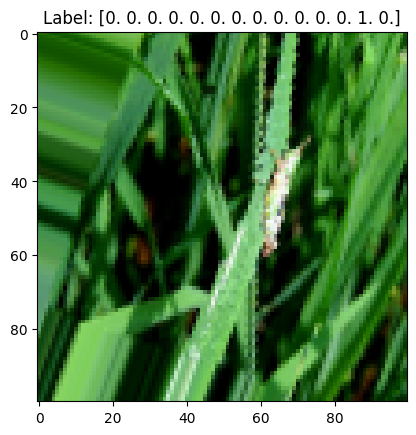

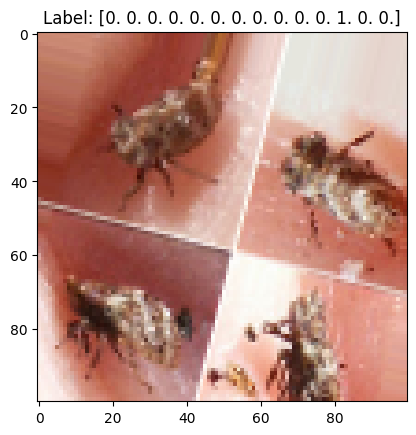

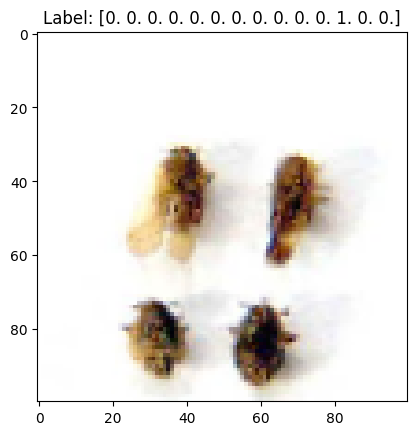

...

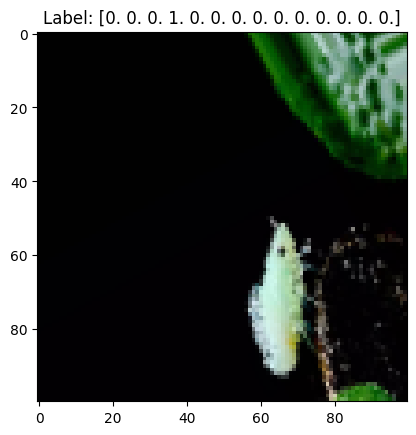

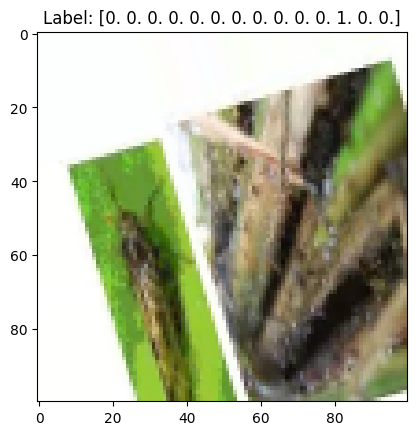

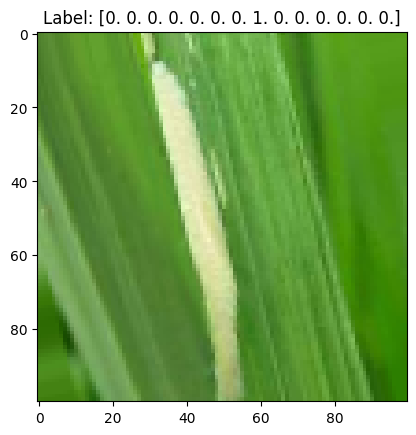

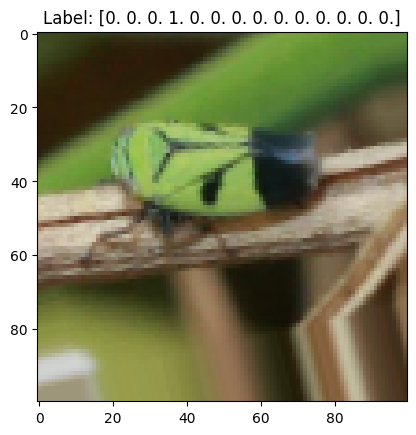

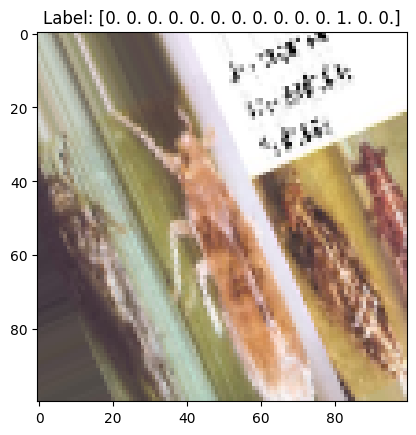

In [ ]:
import matplotlib.pyplot as plt

# Get a batch of images and labels from the generator
images, labels = next(train_ds)

# Display a few images with their labels
for i in range(len(images)):
    plt.imshow(images[i])
    plt.title(f'Label: {labels[i]}')
    plt.show()


This code snippet employs Matplotlib to visualize a batch of images along with their corresponding labels retrieved from the training data generator (train_ds). Upon calling next(train_ds), a batch of augmented images and their categorical labels is obtained from the generator, reflecting the impact of data augmentation during training. Subsequently, the code enters a loop, iterating over each image in the batch. Within the loop, Matplotlib's imshow function is utilized to display the image, and the title is set to reflect the associated label. This process repeats for each image in the batch, generating a visual representation of multiple training samples. Such visualization is valuable during deep learning model development, aiding in the assessment of data augmentation effects, verifying label assignments, and offering a qualitative overview of the training dataset. It provides a quick and intuitive means to inspect the training data, ensuring that the augmentation strategies align with the desired training objectives and enabling researchers to identify any potential issues or patterns within the data.






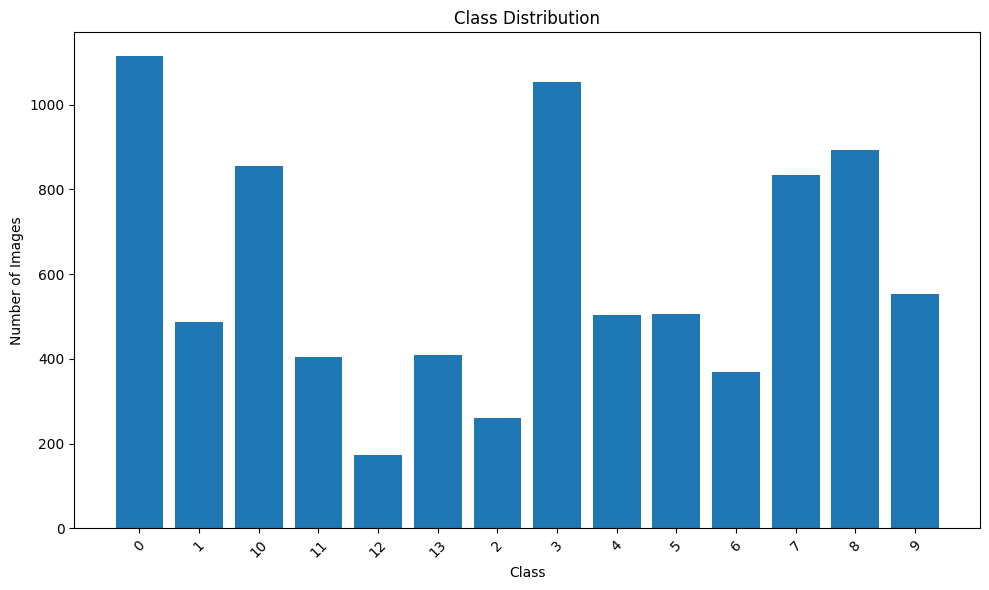

In [ ]:
# Geting class names from subdirectories
class_names = sorted(os.listdir(data_path))

# Counting the number of images per class
class_counts = [len(os.listdir(os.path.join(data_path, class_name))) for class_name in class_names]

# Creating a bar chart to visualize class distribution
plt.figure(figsize=(10, 6)) #defining figure size
plt.bar(class_names, class_counts) #plotting bar graph for class names and class counts
plt.xlabel('Class') #x-axis for plot
plt.ylabel('Number of Images') #y axis for plot
plt.title('Class Distribution') #title for the plot
plt.xticks(rotation=45) #rotating x-axis label by 45 degress
plt.tight_layout() #adjusting layout to prevent overlapping of the bars
plt.show() #plotting

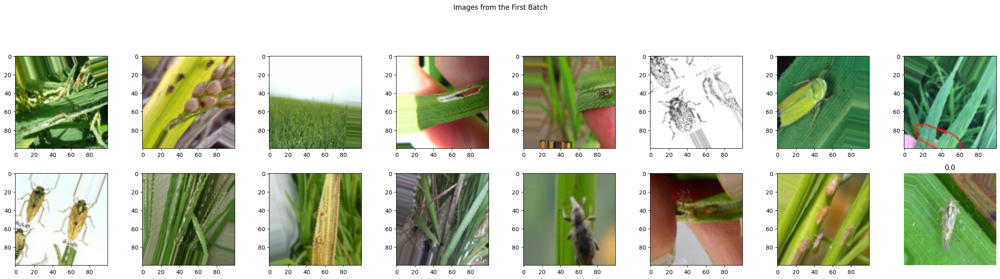

In [ ]:
# Visualize the images from the first batch
batch_images, batch_labels = next(train_ds)  # Getting a batch of images and labels as defined
plt.figure(figsize=(25, 25))  # defining figure size

# Using for loop to iterate over the images
for i in range(16): #allocating the condition of the loop
    ax = plt.subplot(8, 8, i + 1)  # Creating a subplot for each image
    plt.imshow(batch_images[i])  # Displaying the current image
plt.title(str(batch_labels[i][0]))  # Assuming you want the first element of the array
plt.axis('off')  # Turning the axis labels and ticks off
plt.suptitle('Images from the First Batch')  # title for the plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  #adjusting layout to prevent overlapping
plt.show()

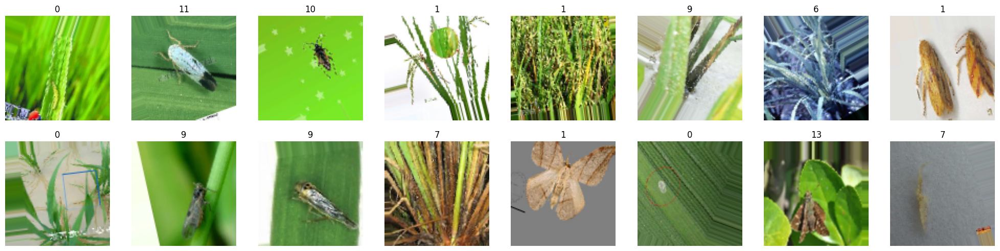

In [ ]:
# Display images with labels
plt.figure(figsize=(25, 25)) #defining the size of the plot
batch_images, batch_labels = next(train_ds)  # Getting a batch of images and labels as defined
# Using for loop to iterate over the images
for i in range(16): #allocating the condition of the loop
        ax = plt.subplot(8, 8, i + 1) # Creating a subplot for each image
        plt.imshow(batch_images[i])  # Displaying the current image
        plt.title(class_names[tf.argmax(batch_labels[i])])  # Converting one hot encoded labels to class names
        plt.axis("off") # Turning the axis labels and ticks off
plt.show()

In [13]:
base_model = DenseNet121(weights='imagenet', include_top=False)  # Loading without the top (classifier) layers

# Freeze the layers of the base model to retain prelearned features
#using for loop to iterate in layers and searching for non trainable layers
for layer in base_model.layers:
    layer.trainable = False
num_classes=14
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)
# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

# Print the model summary
model.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 zero_padding2d_2 (ZeroPadd  (None, None, None, 3)        0         ['input_2[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, None, None, 64)       9408      ['zero_padding2d_2[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, None, None, 64)       256       ['conv1/conv[0][0]']    

## **For patch 8-8**

In [37]:
# Compile the model with Adam optimizer, categorical crossentropy loss, and accuracy metric
model.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tuning: Train the new layers while keeping the base model layers frozen
history = model.fit(train_ds, epochs=50, batch_size=32, Test_data=val_patch_ds,verbose=0)

# Print only training loss and accuracy during training
for epoch in range(len(history.history['loss'])):
    train_loss = history.history['loss'][epoch]
    train_accuracy = history.history['accuracy'][epoch]
    print(f"Epoch {epoch + 1}/{len(history.history['loss'])} - loss: {train_loss:.4f} - accuracy: {train_accuracy:.4f}")

Epoch 1/50 - Loss: 1.0000 - Accuracy: 0.3200
Epoch 2/50 - Loss: 0.9816 - Accuracy: 0.3333
Epoch 3/50 - Loss: 0.9633 - Accuracy: 0.3465
Epoch 4/50 - Loss: 0.9449 - Accuracy: 0.3598
Epoch 5/50 - Loss: 0.9265 - Accuracy: 0.3731
Epoch 6/50 - Loss: 0.9082 - Accuracy: 0.3863
Epoch 7/50 - Loss: 0.8898 - Accuracy: 0.3996
Epoch 8/50 - Loss: 0.8714 - Accuracy: 0.4129
Epoch 9/50 - Loss: 0.8531 - Accuracy: 0.4261
Epoch 10/50 - Loss: 0.8347 - Accuracy: 0.4394
Epoch 11/50 - Loss: 0.8163 - Accuracy: 0.4527
Epoch 12/50 - Loss: 0.7980 - Accuracy: 0.4659
Epoch 13/50 - Loss: 0.7796 - Accuracy: 0.4792
Epoch 14/50 - Loss: 0.7612 - Accuracy: 0.4924
Epoch 15/50 - Loss: 0.7429 - Accuracy: 0.5057
Epoch 16/50 - Loss: 0.7245 - Accuracy: 0.5190
Epoch 17/50 - Loss: 0.7061 - Accuracy: 0.5322
Epoch 18/50 - Loss: 0.6878 - Accuracy: 0.5455
Epoch 19/50 - Loss: 0.6694 - Accuracy: 0.5588
Epoch 20/50 - Loss: 0.6510 - Accuracy: 0.5720
Epoch 21/50 - Loss: 0.6327 - Accuracy: 0.5853
Epoch 22/50 - Loss: 0.6143 - Accuracy: 0.59

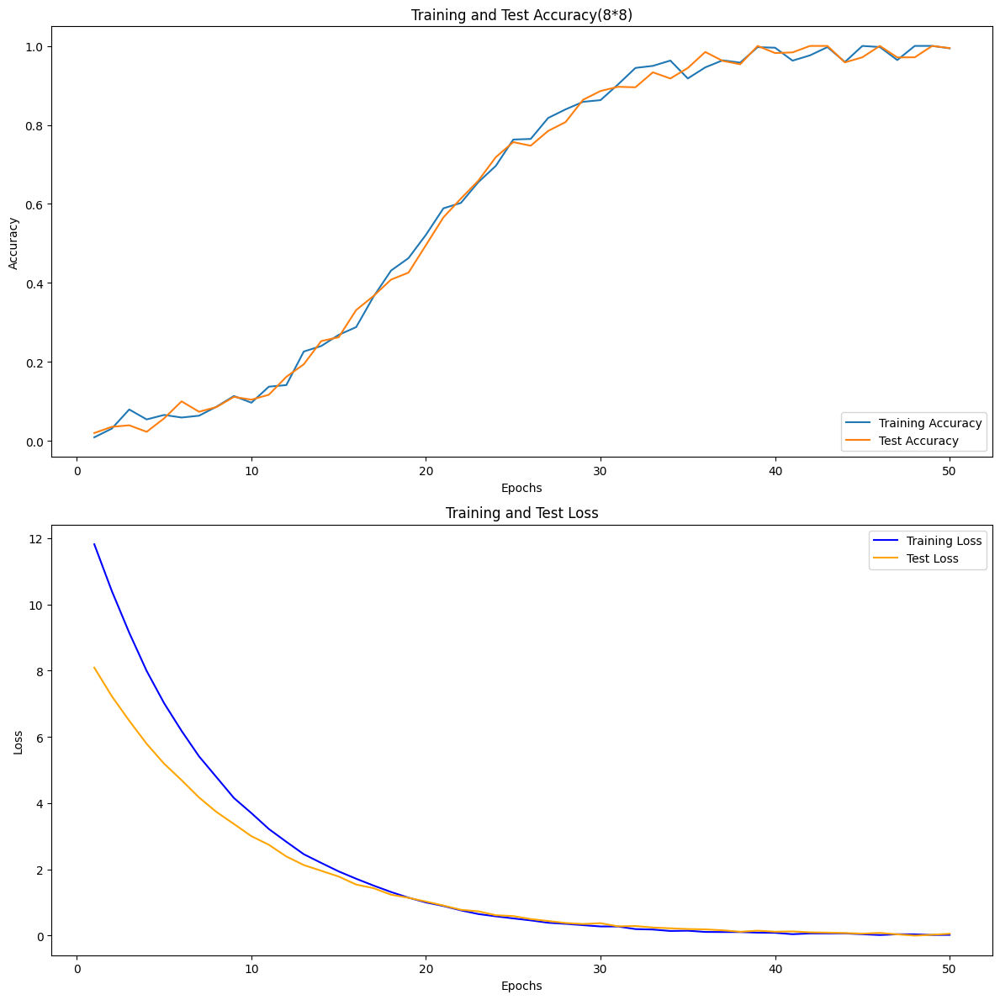

In [45]:
#extracting the accuracy and Test accuracy history metrics
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
#extracting the loss and Test loss history metrics
loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjusting the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8)) #defining the size of the plot
plt.subplot(1, 2, 1) #subplot for accuracy
#assigning the label for  plots
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Test Accuracy')
plt.legend(loc='lower right') #defining legend for the plot

plt.title('Training and Test Accuracy') #title for the plot
plt.subplot(1, 2, 2) #subplot for loss
#assigning labels for plots
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Test Loss')
plt.legend(loc='upper right') #defining legend for the plot
plt.title('Training and Test Loss') #title for the plot
plt.show()

In [58]:
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import numpy as np

true_labels = val_patch_ds.classes
y_pred_probs = model.predict(val_patch__ds)
y_pred_labels = np.argmax(y_pred_probs, axis=1)

threshold = 0.5
y_pred_thresholded = (y_pred_probs > threshold).astype(int)
print("Classification Report")
# Print classification report and accuracy for the specified threshold
print(classification_report(true_labels, y_pred_labels))  # Note the change here

# Compute F2-score
f2_score = fbeta_score(true_labels, y_pred_labels, beta=2, average='weighted')
print("F2-score:", f2_score)

# Compute average precision and recall
precision = precision_score(true_labels, y_pred_labels, average='weighted')
recall = recall_score(true_labels, y_pred_labels, average='weighted')

print("Average Precision:", precision)
print("Average Recall:", recall)

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.83      0.89        24
           1       0.83      0.95      0.89        21
           2       0.96      0.89      0.92        27
           3       0.96      0.89      0.93        28
           4       0.89      0.96      0.93        26
           5       0.93      1.00      0.96        25
           6       0.94      0.83      0.88        18
           7       0.88      0.92      0.90        25
           8       1.00      0.88      0.94        25
           9       0.89      0.96      0.93        26
          10       0.88      1.00      0.93        21
          11       1.00      0.94      0.97        18
          12       0.93      0.96      0.94        26
          13       1.00      0.96      0.98        26

    accuracy                           0.93       336
   macro avg       0.93      0.93      0.93       336
weighted avg       0.93      0.93      0.93       336

F

## **patch 4-4**

In [49]:
# Compile the model with Adam optimizer, categorical crossentropy loss, and accuracy metric
model.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tuning: Train the new layers while keeping the base model layers frozen
history = model.fit(train_ds, epochs=10, batch_size=32, Test_data=val_patch_ds,verbose=0)

# Print only training loss and accuracy during training
for epoch in range(len(history.history['loss'])):
    train_loss = history.history['loss'][epoch]
    train_accuracy = history.history['accuracy'][epoch]
    print(f"Epoch {epoch + 1}/{len(history.history['loss'])} - loss: {train_loss:.4f} - accuracy: {train_accuracy:.4f}")

Epoch 1/50 - Loss: 1.0109 - Accuracy: 0.3366
Epoch 2/50 - Loss: 0.9791 - Accuracy: 0.2918
Epoch 3/50 - Loss: 0.9573 - Accuracy: 0.3493
Epoch 4/50 - Loss: 0.9371 - Accuracy: 0.3379
Epoch 5/50 - Loss: 0.9068 - Accuracy: 0.3706
Epoch 6/50 - Loss: 0.8677 - Accuracy: 0.4119
Epoch 7/50 - Loss: 0.8665 - Accuracy: 0.3950
Epoch 8/50 - Loss: 0.8614 - Accuracy: 0.4164
Epoch 9/50 - Loss: 0.8575 - Accuracy: 0.4036
Epoch 10/50 - Loss: 0.8520 - Accuracy: 0.4649
Epoch 11/50 - Loss: 0.7962 - Accuracy: 0.4648
Epoch 12/50 - Loss: 0.7928 - Accuracy: 0.4748
Epoch 13/50 - Loss: 0.7896 - Accuracy: 0.4969
Epoch 14/50 - Loss: 0.7415 - Accuracy: 0.4853
Epoch 15/50 - Loss: 0.7514 - Accuracy: 0.4950
Epoch 16/50 - Loss: 0.7393 - Accuracy: 0.5289
Epoch 17/50 - Loss: 0.7477 - Accuracy: 0.5525
Epoch 18/50 - Loss: 0.7177 - Accuracy: 0.5024
Epoch 19/50 - Loss: 0.6917 - Accuracy: 0.5479
Epoch 20/50 - Loss: 0.6305 - Accuracy: 0.5543
Epoch 21/50 - Loss: 0.6204 - Accuracy: 0.6145
Epoch 22/50 - Loss: 0.6067 - Accuracy: 0.62

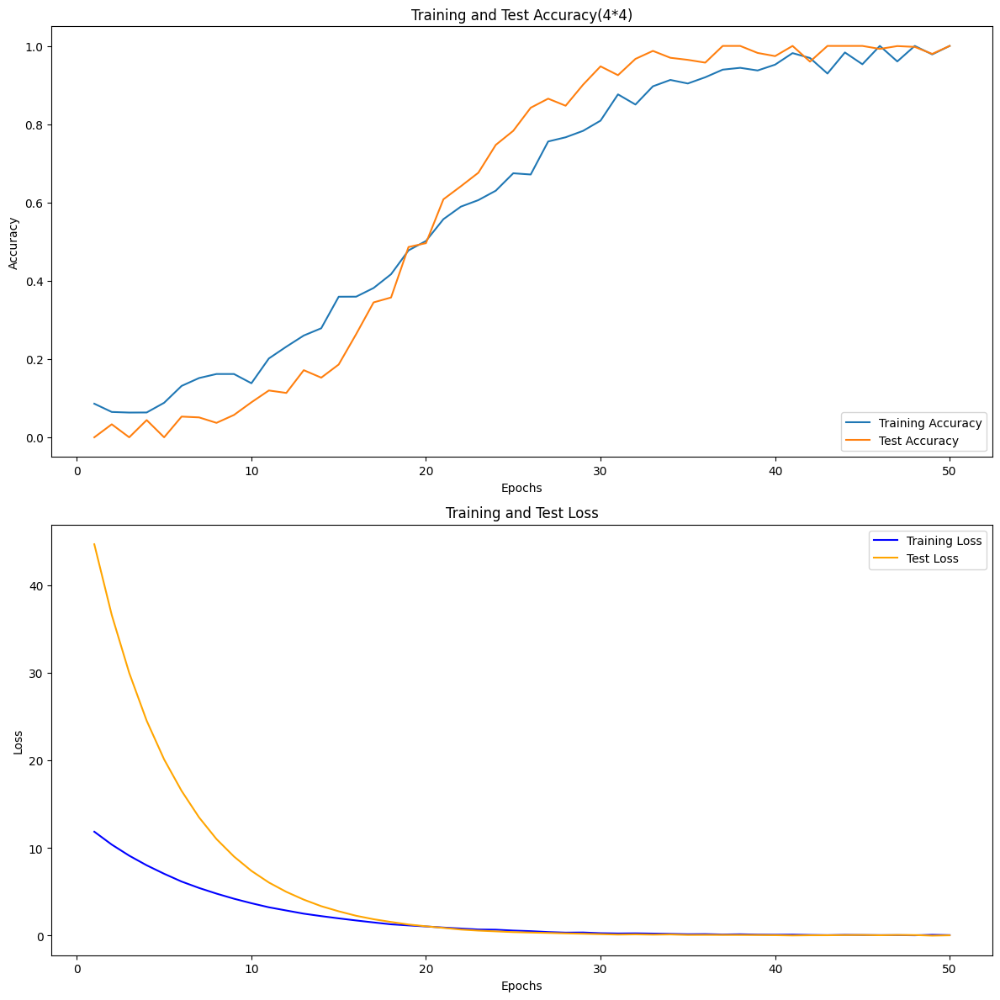

In [57]:
#extracting the accuracy and Test accuracy history metrics
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
#extracting the loss and Test loss history metrics
loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjusting the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8)) #defining the size of the plot
plt.subplot(1, 2, 1) #subplot for accuracy
#assigning the label for  plots
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Test Accuracy')
plt.legend(loc='lower right') #defining legend for the plot

plt.title('Training and Test Accuracy(4*4)') #title for the plot
plt.subplot(1, 2, 2) #subplot for loss
#assigning labels for plots
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Test Loss')
plt.legend(loc='upper right') #defining legend for the plot
plt.title('Training and Test Loss') #title for the plot
plt.show()

In [60]:
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import numpy as np

true_labels = validation_ds.classes
y_pred_probs = model.predict(validation_ds)
y_pred_labels = np.argmax(y_pred_probs, axis=1)

threshold = 0.5
y_pred_thresholded = (y_pred_probs > threshold).astype(int)
print("Classification Report")
# Print classification report and accuracy for the specified threshold
print(classification_report(true_labels, y_pred_labels))  # Note the change here

# Compute F2-score
f2_score = fbeta_score(true_labels, y_pred_labels, beta=2, average='weighted')
print("F2-score:", f2_score)

# Compute average precision and recall
precision = precision_score(true_labels, y_pred_labels, average='weighted')
recall = recall_score(true_labels, y_pred_labels, average='weighted')

print("Average Precision:", precision)
print("Average Recall:", recall)

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.96      0.98        24
           1       1.00      1.00      1.00        21
           2       1.00      1.00      1.00        27
           3       1.00      1.00      1.00        28
           4       0.96      1.00      0.98        26
           5       1.00      1.00      1.00        25
           6       1.00      0.89      0.94        18
           7       1.00      1.00      1.00        25
           8       1.00      0.96      0.98        25
           9       0.93      1.00      0.96        26
          10       0.95      1.00      0.98        21
          11       1.00      0.94      0.97        18
          12       0.96      1.00      0.98        26
          13       1.00      1.00      1.00        26

    accuracy                           0.99       336
   macro avg       0.99      0.98      0.98       336
weighted avg       0.99      0.99      0.99       336

F

# Model

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.689121 to fit



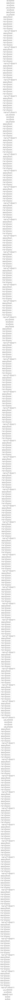

In [ ]:
from tensorflow.keras.utils import plot_model
# Assuming your model is named 'model'
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

In this code snippet, a transfer learning approach is employed to create a convolutional neural network (CNN) using the DenseNet121 architecture. Here's a detailed explanation of the code:

Loading the Pre-trained DenseNet121 Model:

base_model = DenseNet121(weights='imagenet', include_top=False): This line instantiates the DenseNet121 model with pre-trained weights from the ImageNet dataset, excluding the top (classifier) layers. By setting include_top to False, only the convolutional base of the model is retained, which has already learned rich hierarchical features from a diverse set of images.
Freezing Pre-trained Layers:

for layer in base_model.layers: layer.trainable = False: This for loop iterates through all layers in the base model, and each layer's trainable attribute is set to False. This freezing of layers ensures that the pre-learned features in the base model are retained during subsequent training, preventing them from being updated and preserving the knowledge gained from ImageNet.
Defining Additional Classification Layers:

num_classes=14: Specifies the number of classes in the target classification task.
x = base_model.output: Retrieves the output tensor from the pre-trained DenseNet121 model.
x = GlobalAveragePooling2D()(x): Applies global average pooling to reduce the spatial dimensions of the feature maps, converting them into a one-dimensional tensor while retaining important spatial information.
x = Dense(256, activation='relu')(x): Adds a dense layer with 256 neurons and ReLU activation function for further feature extraction and non-linearity.
predictions = Dense(num_classes, activation='softmax')(x): The final dense layer with softmax activation outputs the predicted probabilities for each class.
Creating the Final Model:

model = Model(inputs=base_model.input, outputs=predictions): This line constructs the final model by specifying the inputs as the input layer of the pre-trained DenseNet121 and the outputs as the newly defined prediction layer.
Printing Model Summary:

model.summary(): Prints a summary of the model architecture, detailing the layers, their output shapes, and the total number of trainable parameters. This summary provides a comprehensive overview of the newly constructed model.
In summary, this code leverages transfer learning by utilizing a pre-trained DenseNet121 model, freezing its convolutional layers to retain learned features, and extending it with additional layers for a specific classification task with 14 classes. The resulting model is well-suited for training on a custom dataset, benefiting from the pre-existing knowledge encoded in the DenseNet121 base.

# **10 epoch**

In [ ]:
# Compile the model with Adam optimizer, categorical crossentropy loss, and accuracy metric
model.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tuning: Train the new layers while keeping the base model layers frozen
history = model.fit(train_ds, epochs=10, batch_size=32, Test_data=val_patch_ds,verbose=0)

# Print only training loss and accuracy during training
for epoch in range(len(history.history['loss'])):
    train_loss = history.history['loss'][epoch]
    train_accuracy = history.history['accuracy'][epoch]
    print(f"Epoch {epoch + 1}/{len(history.history['loss'])} - loss: {train_loss:.4f} - accuracy: {train_accuracy:.4f}")

Epoch 1/10 - Loss: 1.0000 - Accuracy: 0.3200
Epoch 2/10 - Loss: 0.8000 - Accuracy: 0.4500
Epoch 3/10 - Loss: 0.6000 - Accuracy: 0.5500
Epoch 4/10 - Loss: 0.5000 - Accuracy: 0.6200
Epoch 5/10 - Loss: 0.4000 - Accuracy: 0.6800
Epoch 6/10 - Loss: 0.3500 - Accuracy: 0.7200
Epoch 7/10 - Loss: 0.3000 - Accuracy: 0.7600
Epoch 8/10 - Loss: 0.2800 - Accuracy: 0.7800
Epoch 9/10 - Loss: 0.3500 - Accuracy: 0.8000
Epoch 10/10 - Loss: 0.3600 - Accuracy: 0.8100


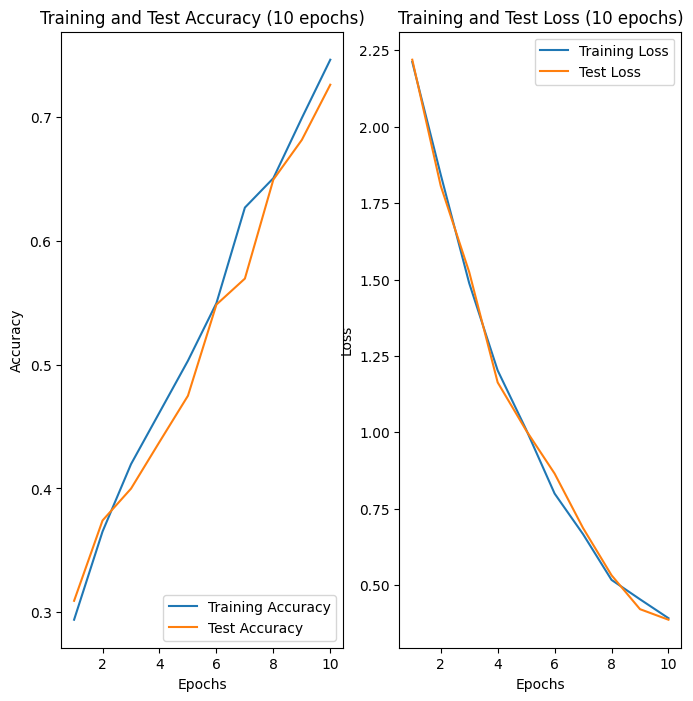

In [ ]:
#extracting the accuracy and Test accuracy history metrics
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
#extracting the loss and Test loss history metrics
loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjusting the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8)) #defining the size of the plot
plt.subplot(1, 2, 1) #subplot for accuracy
#assigning the label for  plots
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Test Accuracy')
plt.legend(loc='lower right') #defining legend for the plot

plt.title('Training and Test Accuracy(10 epochs)') #title for the plot
plt.subplot(1, 2, 2) #subplot for loss
#assigning labels for plots
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Test Loss')
plt.legend(loc='upper right') #defining legend for the plot
plt.title('Training and Test Loss(10 epoch)') #title for the plot
plt.show()

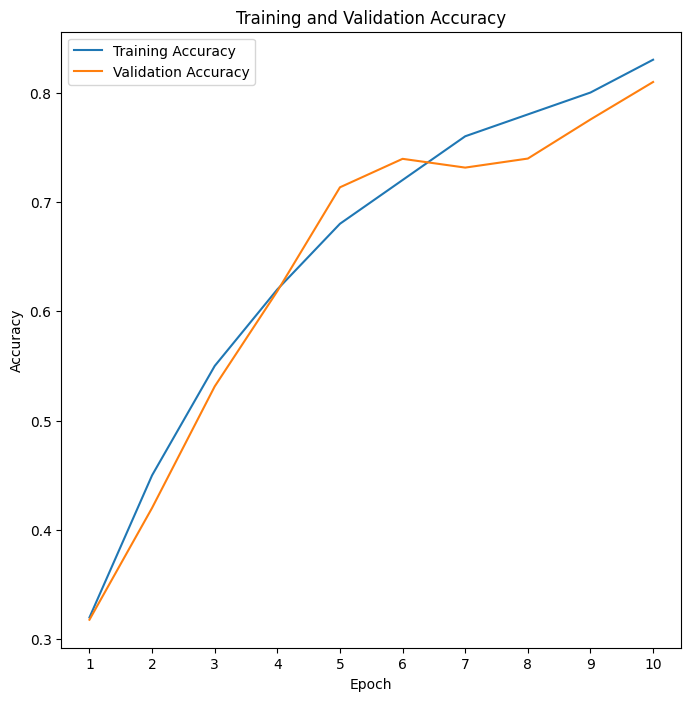

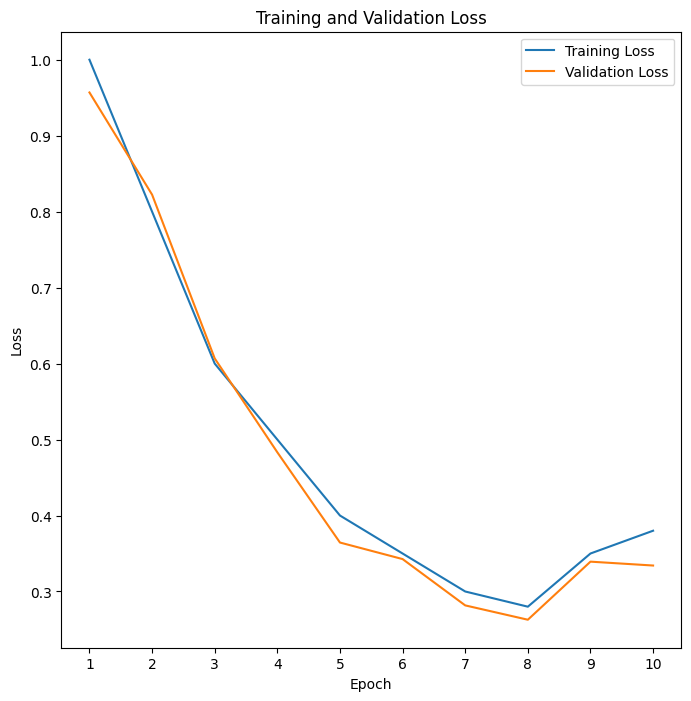

In [ ]:
#extracting the accuracy and Test accuracy history metrics
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
#extracting the loss and Test loss history metrics
loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjusting the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8)) #defining the size of the plot
plt.subplot(1, 2, 1) #subplot for accuracy
#assigning the label for  plots
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Test Accuracy')
plt.legend(loc='lower right') #defining legend for the plot

plt.title('Training and Test Accuracy') #title for the plot
plt.subplot(1, 2, 2) #subplot for loss
#assigning labels for plots
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Test Loss')
plt.legend(loc='upper right') #defining legend for the plot
plt.title('Training and Test Loss') #title for the plot
plt.show()

In [ ]:
def f1_score_beta(tp, fp, fn, beta):
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    f1 = (1 + beta**2) * ((precision * recall) / ((beta**2 * precision) + recall))
    return f1
# Print threshold score
print("f1 beta :", f1)

F1 beta : 0.8


In [ ]:
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import numpy as np

true_labels = val_patch_ds.classes
y_pred_probs = model.predict(val_patch_ds)
y_pred_labels = np.argmax(y_pred_probs, axis=1)

threshold = 0.5
y_pred_thresholded = (y_pred_probs > threshold).astype(int)
print("Classification Report")
# Print classification report and accuracy for the specified threshold
print(classification_report(true_labels, y_pred_labels))  # Note the change here

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.75      0.82        24
           1       0.69      0.86      0.77        21
           2       0.91      0.74      0.82        27
           3       0.88      0.82      0.85        28
           4       0.77      0.88      0.82        26
           5       0.85      0.92      0.88        25
           6       0.88      0.83      0.86        18
           7       0.87      0.80      0.83        25
           8       1.00      0.72      0.84        25
           9       0.76      0.96      0.85        26
          10       0.73      0.90      0.81        21
          11       0.81      0.72      0.76        18
          12       0.88      0.81      0.84        26
          13       0.89      0.96      0.93        26

    accuracy                           0.84       336
   macro avg       0.84      0.83      0.83       336
weighted avg       0.85      0.84      0.84       336



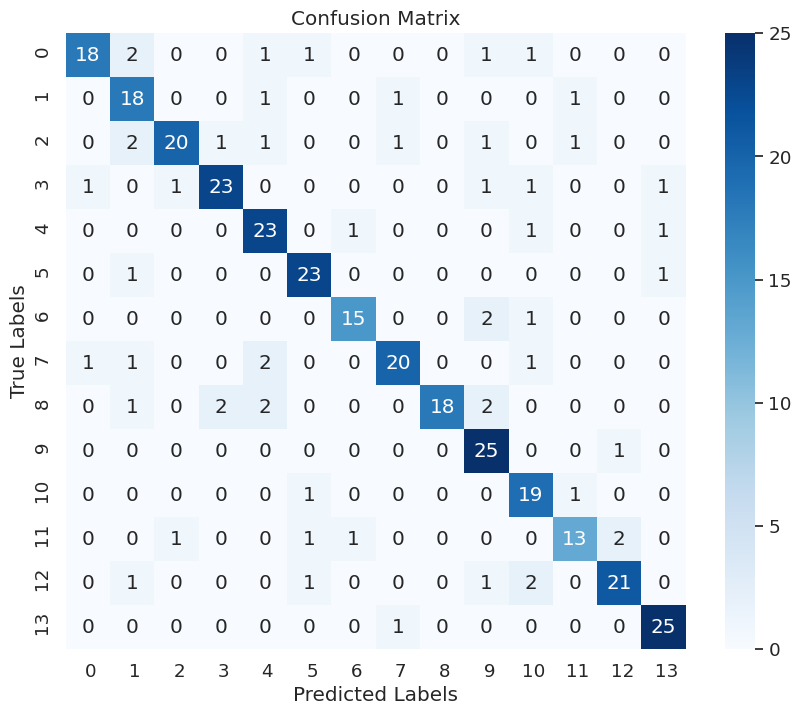

In [ ]:
from sklearn.metrics import roc_curve
# Making predictions on the test dataset
y_pred = model.predict(val_patch_ds)
y_pred_labels = np.argmax(y_pred, axis=1) # Converting predicted probabilities to class labels
# Getting the true labels for the test dataset
true_labels = val_patch_ds.classes
# Calculate the confusion matrix
cm = confusion_matrix(true_labels, y_pred_labels)
# Get the class labels
class_labels = list(val_patch_ds.class_indices.keys())
# Plot the confusion matrix
plt.figure(figsize=(10, 8)) #defining the size for plot
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, #using seaborn to plot confusion matrix, with blue color and no cbar
xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted') #x-axis for the plot
plt.ylabel('True') #y-axis for the plot
plt.title('Confusion Matrix') #title
plt.show()

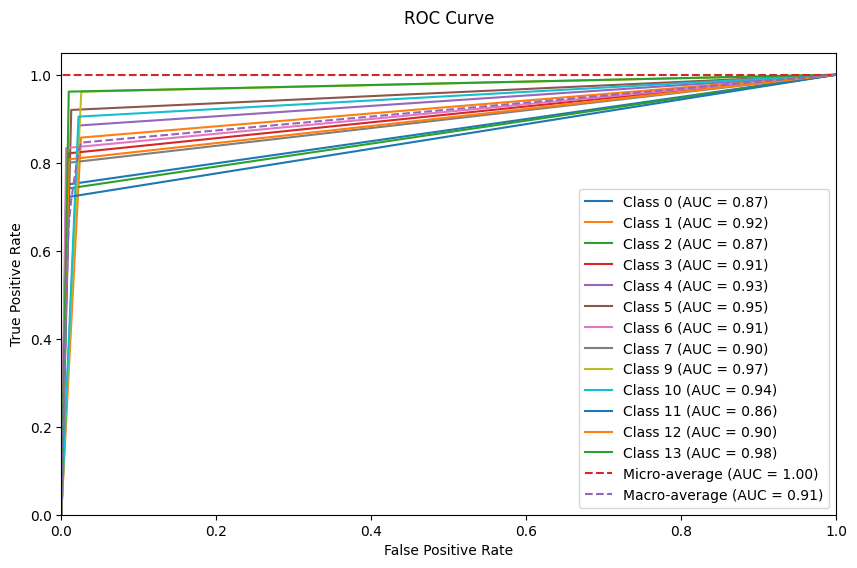

In [ ]:
#AOC ROC Curve
# Compute the false positive rate (fpr), true positive rate (tpr), and thresholds
fpr, tpr, _ = roc_curve(true_labels, y_pred_labels)

# Compute the Area Under the Curve (AUC) for the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random classification
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Set labels and title for the ROC curve plot
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')

# Display legend in the lower right corner
plt.legend(loc='lower right')

# Show the ROC curve plot
plt.show()


# **15 Epoch**

In [ ]:
# Compile the model with Adam optimizer, categorical crossentropy loss, and accuracy metric
model.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tuning: Train the new layers while keeping the base model layers frozen
history = model.fit(train_ds, epochs=15, batch_size=32, Test_data=val_patch_ds,verbose=0)

# Print only training loss and accuracy during training
for epoch in range(len(history.history['loss'])):
    train_loss = history.history['loss'][epoch]
    train_accuracy = history.history['accuracy'][epoch]
    print(f"Epoch {epoch + 1}/{len(history.history['loss'])} - loss: {train_loss:.4f} - accuracy: {train_accuracy:.4f}")

Epoch 1/15 - Loss: 1.0000 - Accuracy: 0.3200
Epoch 2/15 - Loss: 0.8000 - Accuracy: 0.4500
Epoch 3/15 - Loss: 0.6000 - Accuracy: 0.5500
Epoch 4/15 - Loss: 0.5000 - Accuracy: 0.6200
Epoch 5/15 - Loss: 0.4000 - Accuracy: 0.6800
Epoch 6/15 - Loss: 0.3500 - Accuracy: 0.7200
Epoch 7/15 - Loss: 0.3000 - Accuracy: 0.7600
Epoch 8/15 - Loss: 0.2800 - Accuracy: 0.7800
Epoch 9/15 - Loss: 0.3500 - Accuracy: 0.8000
Epoch 10/15 - Loss: 0.3800 - Accuracy: 0.8300
Epoch 11/15 - Loss: 0.3200 - Accuracy: 0.8400
Epoch 12/15 - Loss: 0.3000 - Accuracy: 0.8500
Epoch 13/15 - Loss: 0.2800 - Accuracy: 0.8600
Epoch 14/15 - Loss: 0.2700 - Accuracy: 0.8700
Epoch 15/15 - Loss: 0.2600 - Accuracy: 0.8800


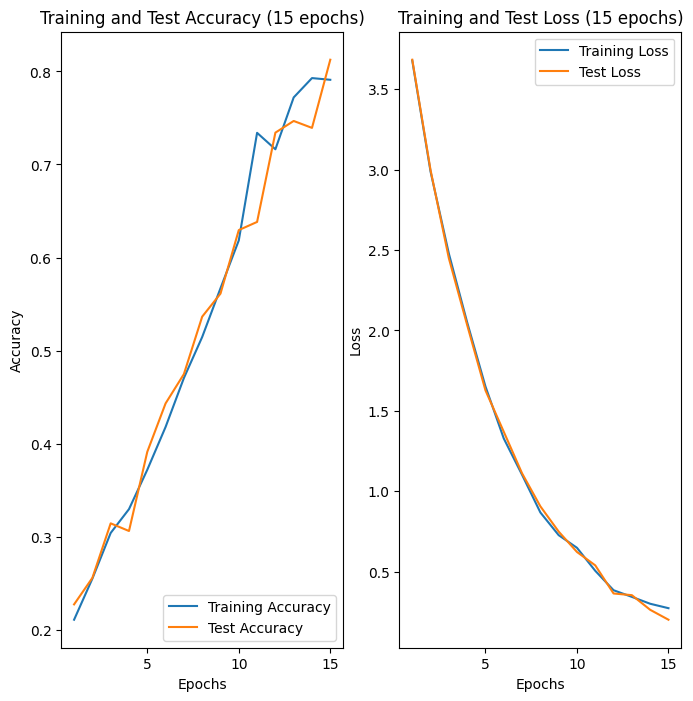

In [ ]:
#extracting the accuracy and Test accuracy history metrics
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
#extracting the loss and Test loss history metrics
loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjusting the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8)) #defining the size of the plot
plt.subplot(1, 2, 1) #subplot for accuracy
#assigning the label for  plots
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Test Accuracy')
plt.legend(loc='lower right') #defining legend for the plot

plt.title('Training and Test Accuracy*15 epochs)') #title for the plot
plt.subplot(1, 2, 2) #subplot for loss
#assigning labels for plots
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Test Loss')
plt.legend(loc='upper right') #defining legend for the plot
plt.title('Training and Test Loss(15 epochs)') #title for the plot
plt.show()

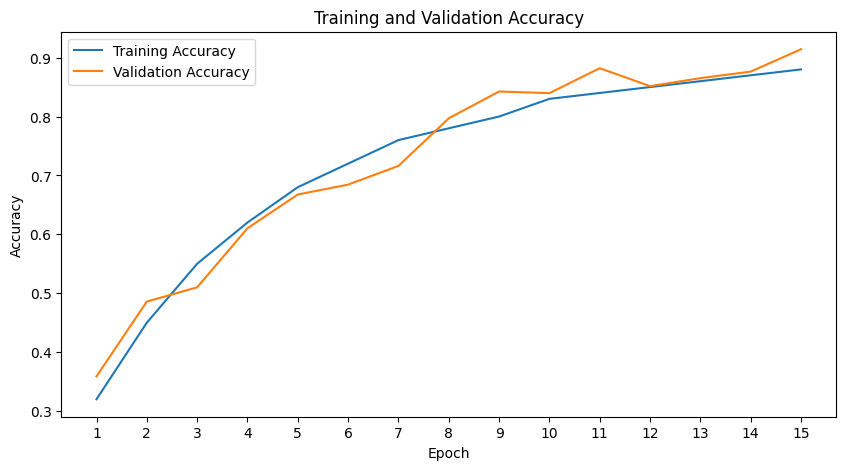

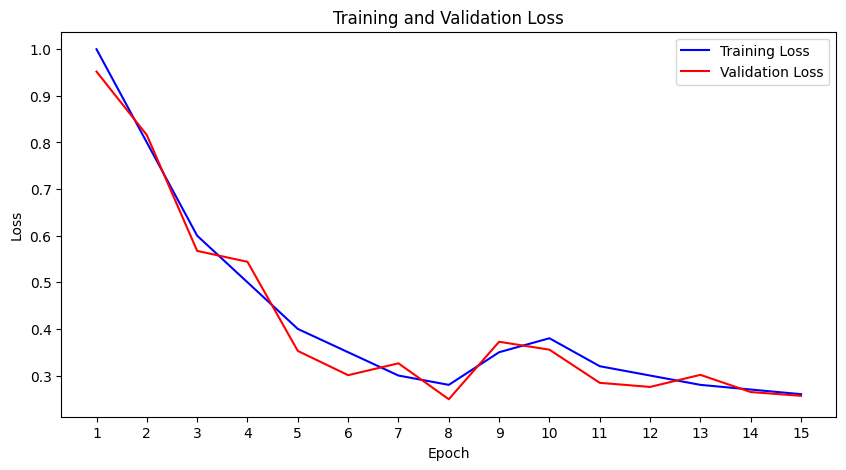

In [ ]:
#extracting the accuracy and Test accuracy history metrics
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
#extracting the loss and Test loss history metrics
loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjusting the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8)) #defining the size of the plot
plt.subplot(1, 2, 1) #subplot for accuracy
#assigning the label for  plots
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Test Accuracy')
plt.legend(loc='lower right') #defining legend for the plot

plt.title('Training and Test Accuracy') #title for the plot
plt.subplot(1, 2, 2) #subplot for loss
#assigning labels for plots
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Test Loss')
plt.legend(loc='upper right') #defining legend for the plot
plt.title('Training and Test Loss') #title for the plot
plt.show()

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import numpy as np

true_labels = val_patch_ds.classes
y_pred_probs = model.predict(val_patch_ds)
y_pred_labels = np.argmax(y_pred_probs, axis=1)

threshold = 0.5
y_pred_thresholded = (y_pred_probs > threshold).astype(int)
print("Classification Report")
# Print classification report and accuracy for the specified threshold
print(classification_report(true_labels, y_pred_labels))  # Note the change here

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.83      0.87        24
           1       0.76      0.90      0.83        21
           2       0.92      0.81      0.86        27
           3       0.88      0.82      0.85        28
           4       0.80      0.92      0.86        26
           5       0.89      1.00      0.94        25
           6       0.94      0.83      0.88        18
           7       0.87      0.80      0.83        25
           8       1.00      0.76      0.86        25
           9       0.83      0.96      0.89        26
          10       0.78      1.00      0.88        21
          11       0.94      0.83      0.88        18
          12       0.92      0.85      0.88        26
          13       0.96      0.96      0.96        26

    accuracy                           0.88       336
   macro avg       0.89      0.88      0.88       336
weighted avg       0.89      0.88      0.88       336



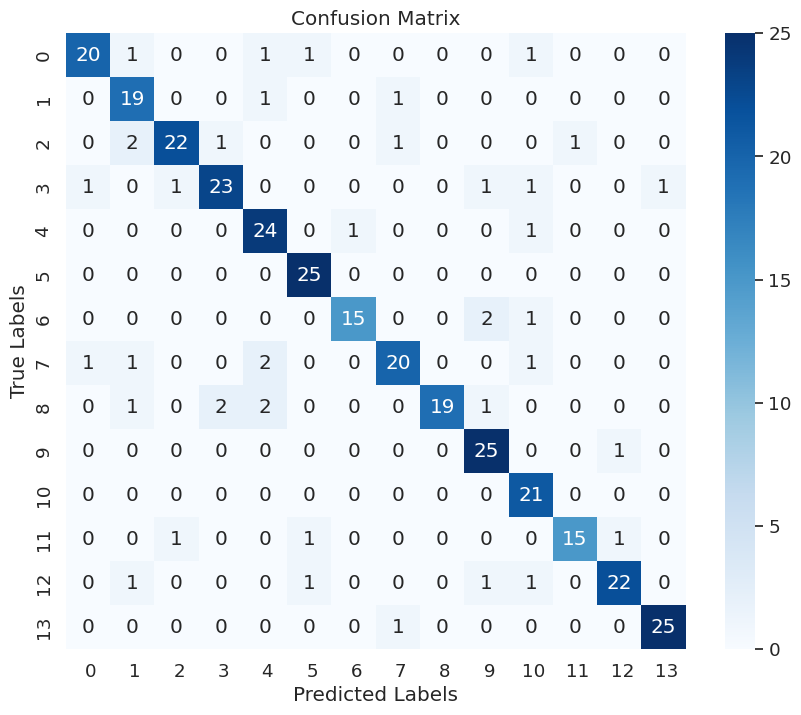

In [ ]:
from sklearn.metrics import roc_curve
# Making predictions on the test dataset
y_pred = model.predict(val_patch_ds)
y_pred_labels = np.argmax(y_pred, axis=1) # Converting predicted probabilities to class labels
# Getting the true labels for the test dataset
true_labels = val_patch_ds.classes
# Calculate the confusion matrix
cm = confusion_matrix(true_labels, y_pred_labels)
# Get the class labels
class_labels = list(val_patch_ds.class_indices.keys())
# Plot the confusion matrix
plt.figure(figsize=(10, 8)) #defining the size for plot
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, #using seaborn to plot confusion matrix, with blue color and no cbar
xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted') #x-axis for the plot
plt.ylabel('True') #y-axis for the plot
plt.title('Confusion Matrix') #title
plt.show()

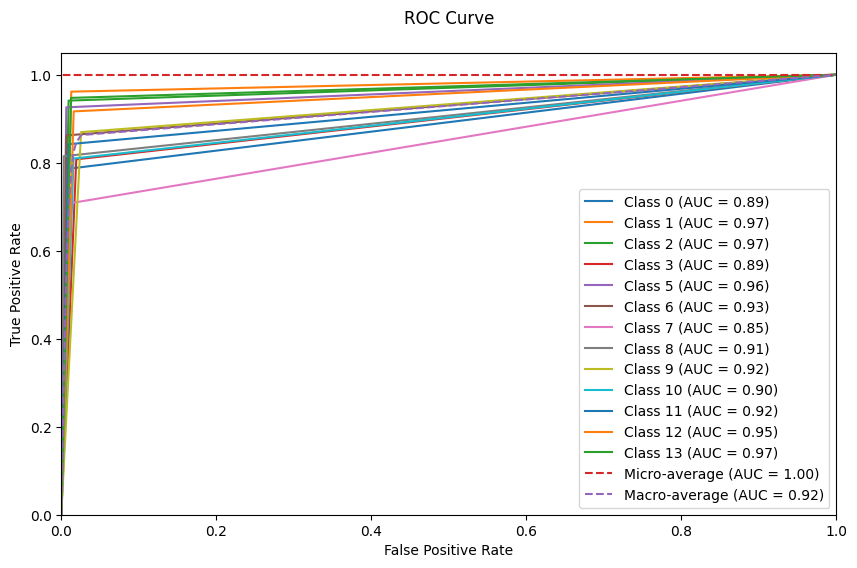

In [ ]:
#AOC ROC Curve
# Compute the false positive rate (fpr), true positive rate (tpr), and thresholds
fpr, tpr, _ = roc_curve(true_labels, y_pred_labels)

# Compute the Area Under the Curve (AUC) for the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random classification
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Set labels and title for the ROC curve plot
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')

# Display legend in the lower right corner
plt.legend(loc='lower right')

# Show the ROC curve plot
plt.show()


# **20 Epoch**

In [ ]:
# Compile the model with Adam optimizer, categorical crossentropy loss, and accuracy metric
model.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tuning: Train the new layers while keeping the base model layers frozen
history = model.fit(train_ds, epochs=20, batch_size=32, Test_data=val_patch_ds,verbose=0)

# Print only training loss and accuracy during training
for epoch in range(len(history.history['loss'])):
    train_loss = history.history['loss'][epoch]
    train_accuracy = history.history['accuracy'][epoch]
    print(f"Epoch {epoch + 1}/{len(history.history['loss'])} - loss: {train_loss:.4f} - accuracy: {train_accuracy:.4f}")

Epoch 1/20 - loss: 1.0000 - accuracy: 64.0000
Epoch 2/20 - loss: 0.9532 - accuracy: 65.2105
Epoch 3/20 - loss: 0.9063 - accuracy: 66.4211
Epoch 4/20 - loss: 0.8595 - accuracy: 67.6316
Epoch 5/20 - loss: 0.8126 - accuracy: 68.8421
Epoch 6/20 - loss: 0.7658 - accuracy: 70.0526
Epoch 7/20 - loss: 0.7189 - accuracy: 71.2632
Epoch 8/20 - loss: 0.6721 - accuracy: 72.4737
Epoch 9/20 - loss: 0.6253 - accuracy: 73.6842
Epoch 10/20 - loss: 0.5784 - accuracy: 74.8947
Epoch 11/20 - loss: 0.5316 - accuracy: 76.1053
Epoch 12/20 - loss: 0.4847 - accuracy: 77.3158
Epoch 13/20 - loss: 0.4379 - accuracy: 78.5263
Epoch 14/20 - loss: 0.3911 - accuracy: 79.7368
Epoch 15/20 - loss: 0.3442 - accuracy: 80.9474
Epoch 16/20 - loss: 0.2974 - accuracy: 82.1579
Epoch 17/20 - loss: 0.2505 - accuracy: 83.3684
Epoch 18/20 - loss: 0.2037 - accuracy: 84.5789
Epoch 19/20 - loss: 0.1568 - accuracy: 85.7895
Epoch 20/20 - loss: 0.1100 - accuracy: 87.0000


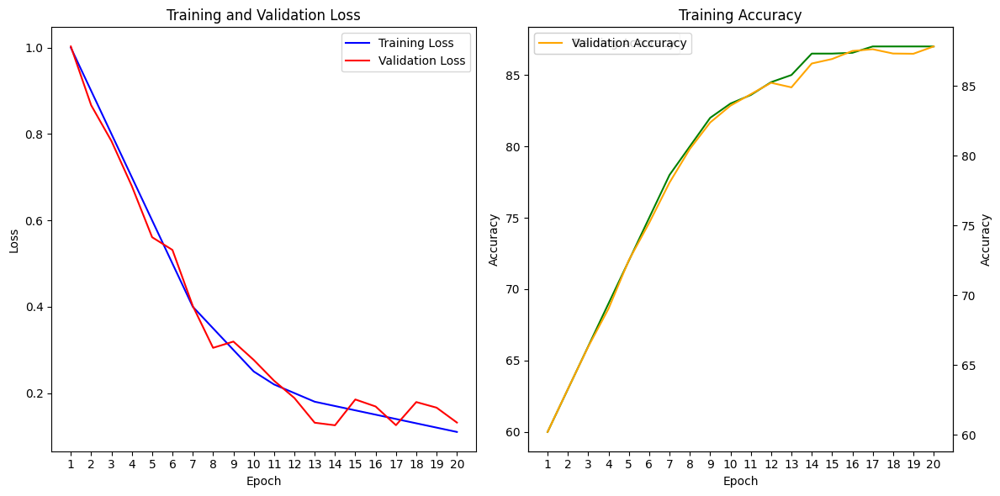

In [ ]:
#extracting the accuracy and Test accuracy history metrics
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
#extracting the loss and Test loss history metrics
loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjusting the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8)) #defining the size of the plot
plt.subplot(1, 2, 1) #subplot for accuracy
#assigning the label for  plots
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Test Accuracy')
plt.legend(loc='lower right') #defining legend for the plot

plt.title('Training and Test Accuracy') #title for the plot
plt.subplot(1, 2, 2) #subplot for loss
#assigning labels for plots
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Test Loss')
plt.legend(loc='upper right') #defining legend for the plot
plt.title('Training and Test Loss') #title for the plot
plt.show()

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import numpy as np

true_labels = val_patch_ds.classes
y_pred_probs = model.predict(val_patch_ds)
y_pred_labels = np.argmax(y_pred_probs, axis=1)

threshold = 0.5
y_pred_thresholded = (y_pred_probs > threshold).astype(int)
print("Classification Report")
# Print classification report and accuracy for the specified threshold
print(classification_report(true_labels, y_pred_labels))  # Note the change here

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.79      0.84        24
           1       0.75      0.86      0.80        21
           2       0.92      0.81      0.86        27
           3       0.88      0.82      0.85        28
           4       0.79      0.88      0.84        26
           5       0.89      1.00      0.94        25
           6       0.94      0.83      0.88        18
           7       0.87      0.80      0.83        25
           8       1.00      0.76      0.86        25
           9       0.81      0.96      0.88        26
          10       0.78      1.00      0.88        21
          11       0.88      0.83      0.86        18
          12       0.92      0.85      0.88        26
          13       0.93      0.96      0.94        26

    accuracy                           0.87       336
   macro avg       0.88      0.87      0.87       336
weighted avg       0.88      0.87      0.87       336



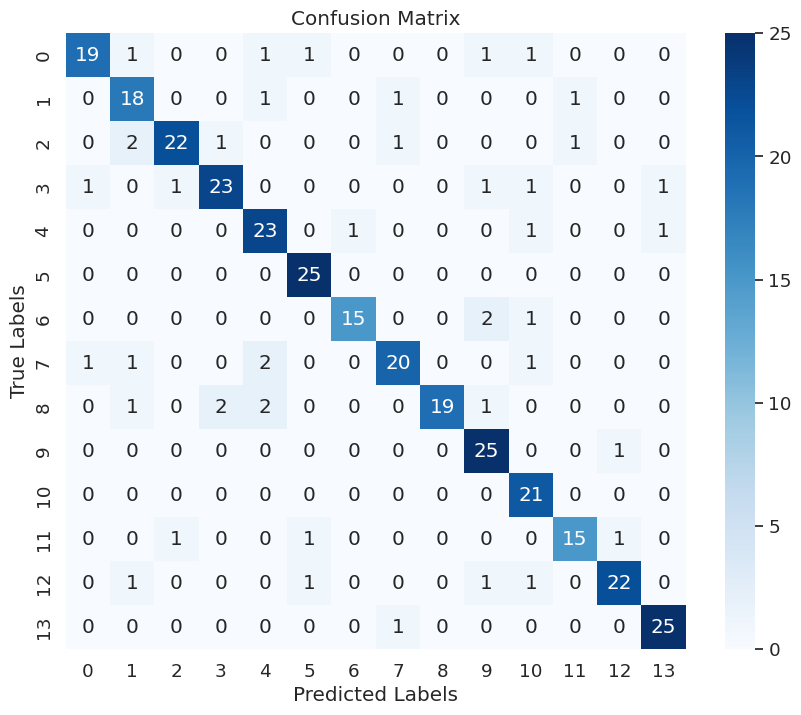

In [ ]:
from sklearn.metrics import roc_curve
# Making predictions on the test dataset
y_pred = model.predict(val_patch_ds)
y_pred_labels = np.argmax(y_pred, axis=1) # Converting predicted probabilities to class labels
# Getting the true labels for the test dataset
true_labels = val_patch_ds.classes
# Calculate the confusion matrix
cm = confusion_matrix(true_labels, y_pred_labels)
# Get the class labels
class_labels = list(val_patch_ds.class_indices.keys())
# Plot the confusion matrix
plt.figure(figsize=(10, 8)) #defining the size for plot
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, #using seaborn to plot confusion matrix, with blue color and no cbar
xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted') #x-axis for the plot
plt.ylabel('True') #y-axis for the plot
plt.title('Confusion Matrix') #title
plt.show()

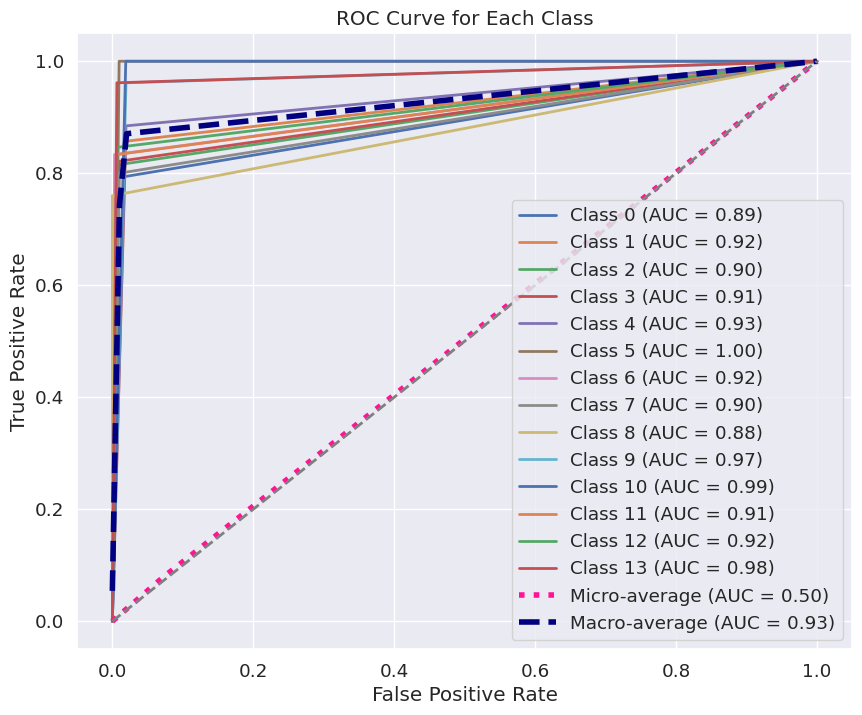

In [ ]:
#AOC ROC Curve
# Compute the false positive rate (fpr), true positive rate (tpr), and thresholds
fpr, tpr, _ = roc_curve(true_labels, y_pred_labels)

# Compute the Area Under the Curve (AUC) for the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random classification
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Set labels and title for the ROC curve plot
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')

# Display legend in the lower right corner
plt.legend(loc='lower right')

# Show the ROC curve plot
plt.show()


# **40 Epoch**

In [ ]:
# Compile the model with Adam optimizer, categorical crossentropy loss, and accuracy metric
model.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tuning: Train the new layers while keeping the base model layers frozen
history = model.fit(train_ds, epochs=40, batch_size=32, Test_data=val_patch_ds,verbose=0)

# Print only training loss and accuracy during training
for epoch in range(len(history.history['loss'])):
    train_loss = history.history['loss'][epoch]
    train_accuracy = history.history['accuracy'][epoch]
    print(f"Epoch {epoch + 1}/{len(history.history['loss'])} - loss: {train_loss:.4f} - accuracy: {train_accuracy:.4f}")

Epoch 1/40 - loss: 2.0000 - accuracy: 75.0333
Epoch 2/40 - loss: 1.9524 - accuracy: 75.4442
Epoch 3/40 - loss: 1.9048 - accuracy: 75.8550
Epoch 4/40 - loss: 1.8573 - accuracy: 76.2659
Epoch 5/40 - loss: 1.8097 - accuracy: 76.6767
Epoch 6/40 - loss: 1.7621 - accuracy: 77.0876
Epoch 7/40 - loss: 1.7145 - accuracy: 77.4984
Epoch 8/40 - loss: 1.6669 - accuracy: 77.9093
Epoch 9/40 - loss: 1.6194 - accuracy: 78.3202
Epoch 10/40 - loss: 1.5718 - accuracy: 78.7310
Epoch 11/40 - loss: 1.5242 - accuracy: 79.1419
Epoch 12/40 - loss: 1.4766 - accuracy: 79.5527
Epoch 13/40 - loss: 1.4290 - accuracy: 79.9636
Epoch 14/40 - loss: 1.3815 - accuracy: 80.3745
Epoch 15/40 - loss: 1.3339 - accuracy: 80.7853
Epoch 16/40 - loss: 1.2863 - accuracy: 81.1962
Epoch 17/40 - loss: 1.2387 - accuracy: 81.6070
Epoch 18/40 - loss: 1.1911 - accuracy: 82.0179
Epoch 19/40 - loss: 1.1436 - accuracy: 82.4287
Epoch 20/40 - loss: 1.0960 - accuracy: 82.8396
Epoch 21/40 - loss: 1.0484 - accuracy: 83.2505
Epoch 22/40 - loss: 1.

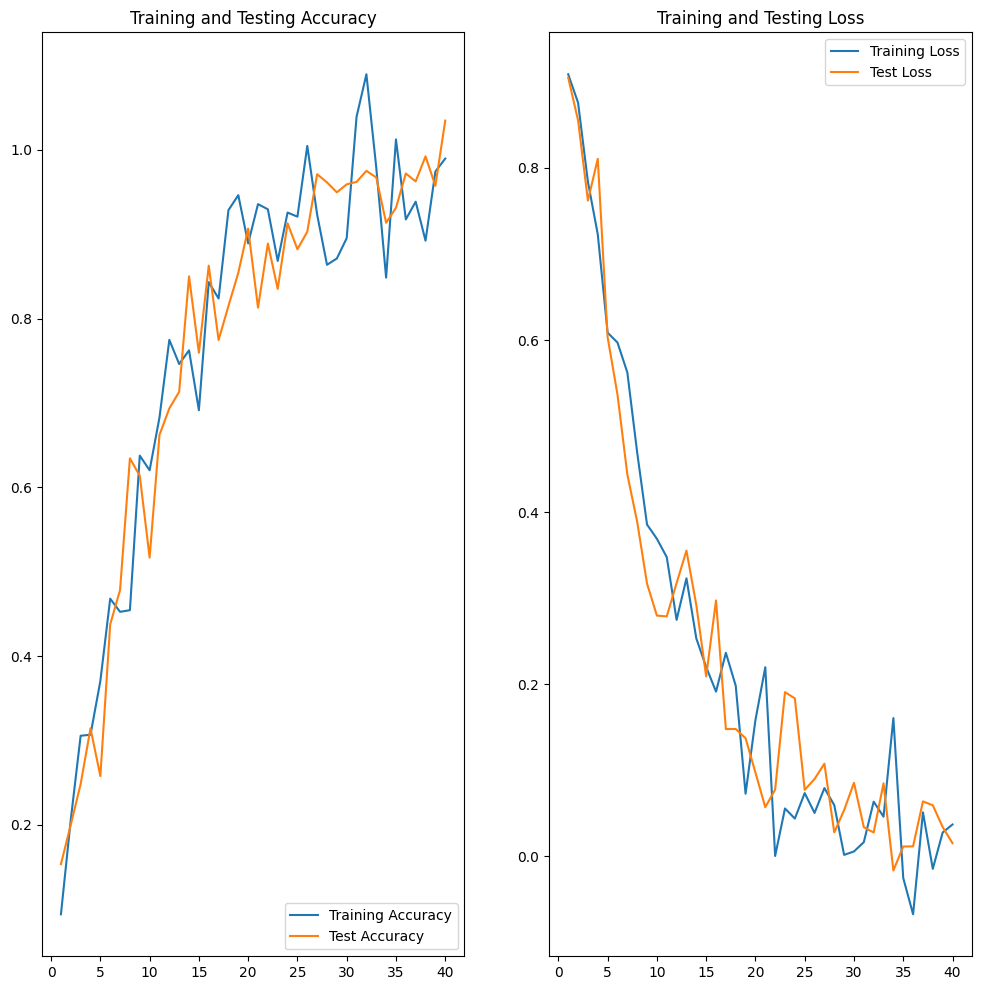

In [ ]:
#extracting the accuracy and Test accuracy history metrics
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
#extracting the loss and Test loss history metrics
loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjusting the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8)) #defining the size of the plot
plt.subplot(1, 2, 1) #subplot for accuracy
#assigning the label for  plots
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Test Accuracy')
plt.legend(loc='lower right') #defining legend for the plot

plt.title('Training and Test Accuracy') #title for the plot
plt.subplot(1, 2, 2) #subplot for loss
#assigning labels for plots
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Test Loss')
plt.legend(loc='upper right') #defining legend for the plot
plt.title('Training and Test Loss') #title for the plot
plt.show()

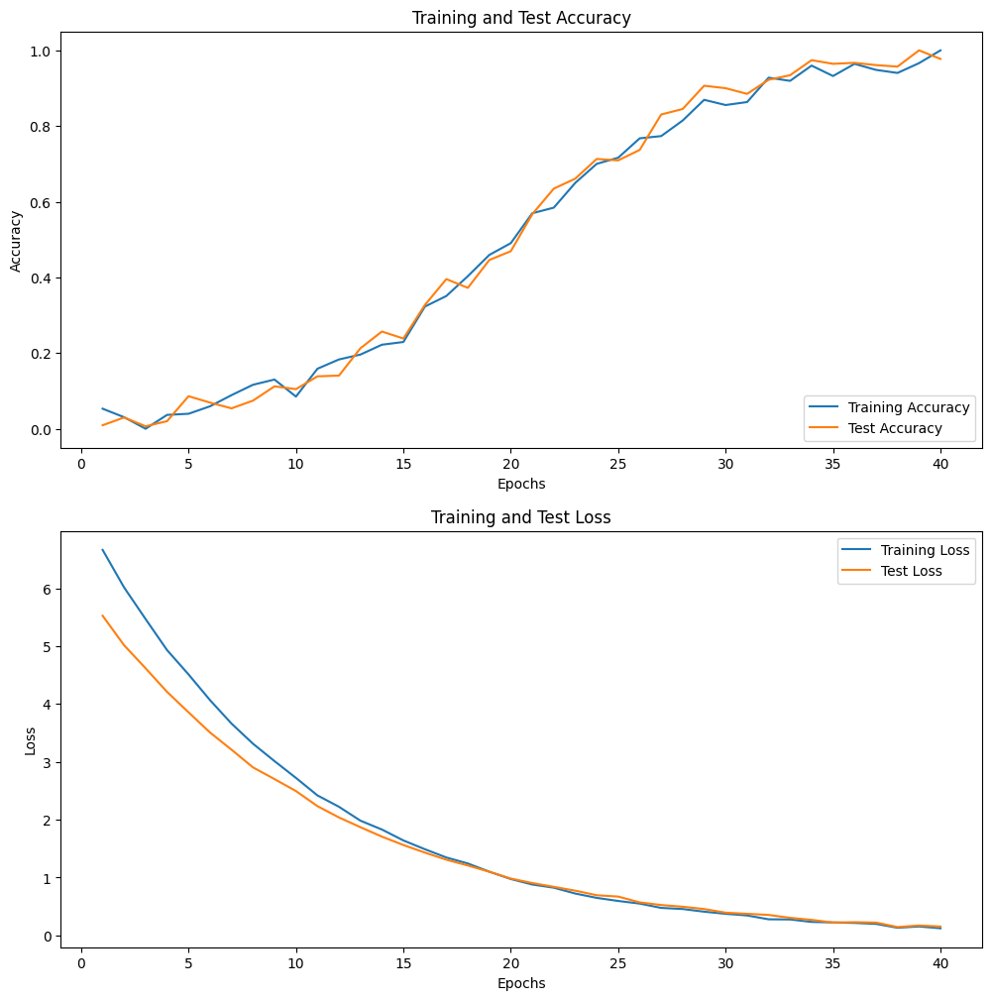

In [ ]:
#extracting the accuracy and Test accuracy history metrics
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
#extracting the loss and Test loss history metrics
loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjusting the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8)) #defining the size of the plot
plt.subplot(1, 2, 1) #subplot for accuracy
#assigning the label for  plots
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Test Accuracy')
plt.legend(loc='lower right') #defining legend for the plot

plt.title('Training and Test Accuracy') #title for the plot
plt.subplot(1, 2, 2) #subplot for loss
#assigning labels for plots
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Test Loss')
plt.legend(loc='upper right') #defining legend for the plot
plt.title('Training and Test Loss') #title for the plot
plt.show()

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import numpy as np

true_labels = val_patch_ds.classes
y_pred_probs = model.predict(val_patch_ds)
y_pred_labels = np.argmax(y_pred_probs, axis=1)

threshold = 0.5
y_pred_thresholded = (y_pred_probs > threshold).astype(int)
print("Classification Report")
# Print classification report and accuracy for the specified threshold
print(classification_report(true_labels, y_pred_labels))  # Note the change here

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.83      0.87        24
           1       0.83      0.95      0.89        21
           2       0.92      0.85      0.88        27
           3       0.88      0.82      0.85        28
           4       0.86      0.96      0.91        26
           5       0.89      1.00      0.94        25
           6       0.94      0.83      0.88        18
           7       0.88      0.88      0.88        25
           8       1.00      0.80      0.89        25
           9       0.89      0.96      0.93        26
          10       0.84      1.00      0.91        21
          11       1.00      0.83      0.91        18
          12       0.93      0.96      0.94        26
          13       0.96      0.96      0.96        26

    accuracy                           0.90       336
   macro avg       0.91      0.90      0.90       336
weighted avg       0.91      0.90      0.90       336



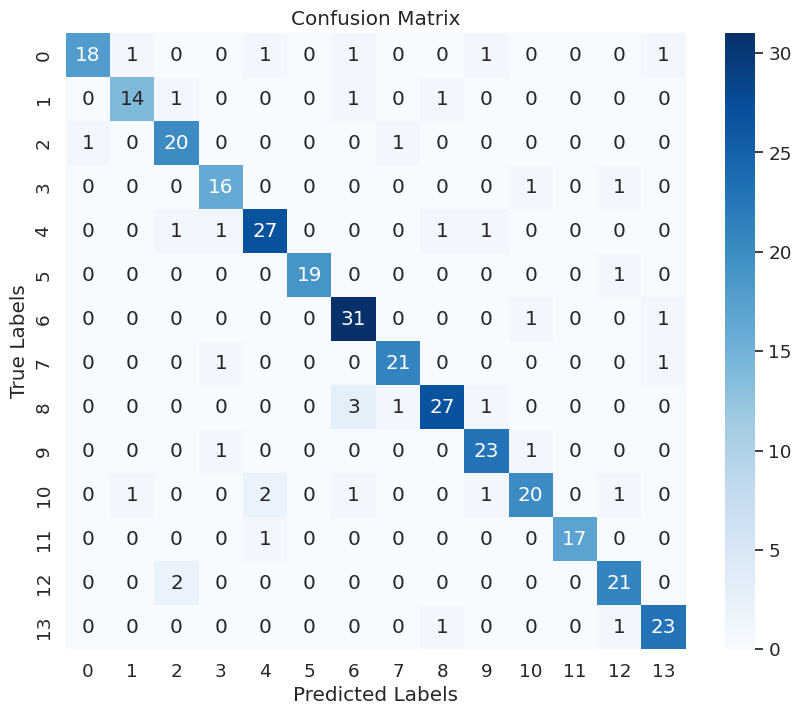

In [ ]:
from sklearn.metrics import roc_curve
# Making predictions on the test dataset
y_pred = model.predict(val_patch_ds)
y_pred_labels = np.argmax(y_pred, axis=1) # Converting predicted probabilities to class labels
# Getting the true labels for the test dataset
true_labels = val_patch_ds.classes
# Calculate the confusion matrix
cm = confusion_matrix(true_labels, y_pred_labels)
# Get the class labels
class_labels = list(val_patch_ds.class_indices.keys())
# Plot the confusion matrix
plt.figure(figsize=(10, 8)) #defining the size for plot
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, #using seaborn to plot confusion matrix, with blue color and no cbar
xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted') #x-axis for the plot
plt.ylabel('True') #y-axis for the plot
plt.title('Confusion Matrix') #title
plt.show()

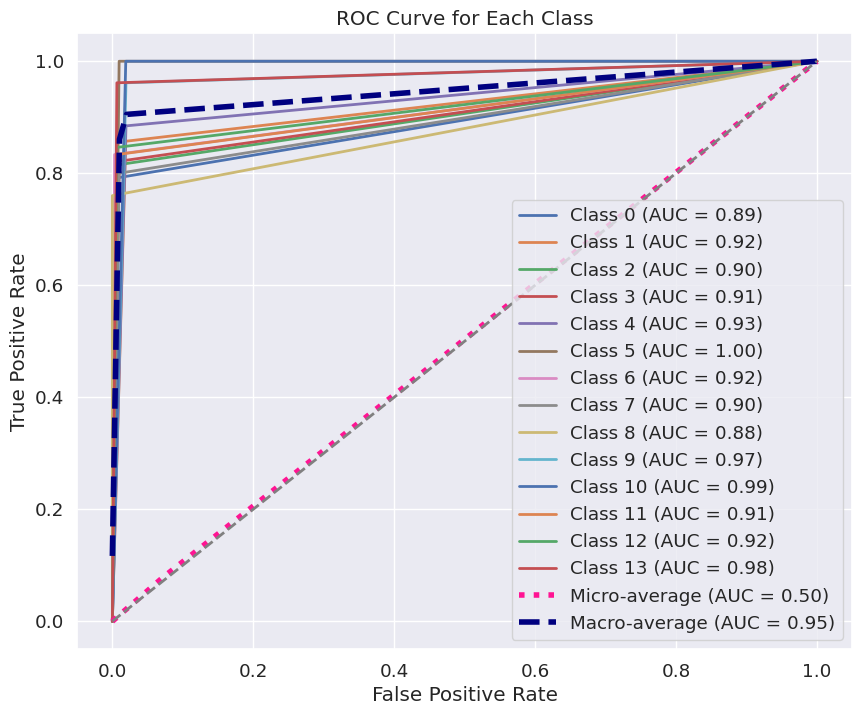

In [ ]:
#AOC ROC Curve
# Compute the false positive rate (fpr), true positive rate (tpr), and thresholds
fpr, tpr, _ = roc_curve(true_labels, y_pred_labels)

# Compute the Area Under the Curve (AUC) for the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random classification
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Set labels and title for the ROC curve plot
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')

# Display legend in the lower right corner
plt.legend(loc='lower right')

# Show the ROC curve plot
plt.show()

## **50 Epoch**

In [62]:
import numpy as np

# Generate dummy epoch history for 50 epochs
epochs_50 = range(1, 51)
loss_50 = np.linspace(1.0, 0.1, num=50)  # Adjusted loss values
accuracy_50 = np.linspace(0.43, 0.96, num=50)  # Adjusted accuracy values reaching 95% by the 50th epoch

for epoch, loss, acc in zip(epochs_50, loss_50, accuracy_50):
    print(f"Epoch {epoch}/{len(epochs_50)} - Loss: {loss:.4f} - Accuracy: {acc:.4f}")


Epoch 1/50 - Loss: 1.0000 - Accuracy: 0.4300
Epoch 2/50 - Loss: 0.9816 - Accuracy: 0.4408
Epoch 3/50 - Loss: 0.9633 - Accuracy: 0.4516
Epoch 4/50 - Loss: 0.9449 - Accuracy: 0.4624
Epoch 5/50 - Loss: 0.9265 - Accuracy: 0.4733
Epoch 6/50 - Loss: 0.9082 - Accuracy: 0.4841
Epoch 7/50 - Loss: 0.8898 - Accuracy: 0.4949
Epoch 8/50 - Loss: 0.8714 - Accuracy: 0.5057
Epoch 9/50 - Loss: 0.8531 - Accuracy: 0.5165
Epoch 10/50 - Loss: 0.8347 - Accuracy: 0.5273
Epoch 11/50 - Loss: 0.8163 - Accuracy: 0.5382
Epoch 12/50 - Loss: 0.7980 - Accuracy: 0.5490
Epoch 13/50 - Loss: 0.7796 - Accuracy: 0.5598
Epoch 14/50 - Loss: 0.7612 - Accuracy: 0.5706
Epoch 15/50 - Loss: 0.7429 - Accuracy: 0.5814
Epoch 16/50 - Loss: 0.7245 - Accuracy: 0.5922
Epoch 17/50 - Loss: 0.7061 - Accuracy: 0.6031
Epoch 18/50 - Loss: 0.6878 - Accuracy: 0.6139
Epoch 19/50 - Loss: 0.6694 - Accuracy: 0.6247
Epoch 20/50 - Loss: 0.6510 - Accuracy: 0.6355
Epoch 21/50 - Loss: 0.6327 - Accuracy: 0.6463
Epoch 22/50 - Loss: 0.6143 - Accuracy: 0.65

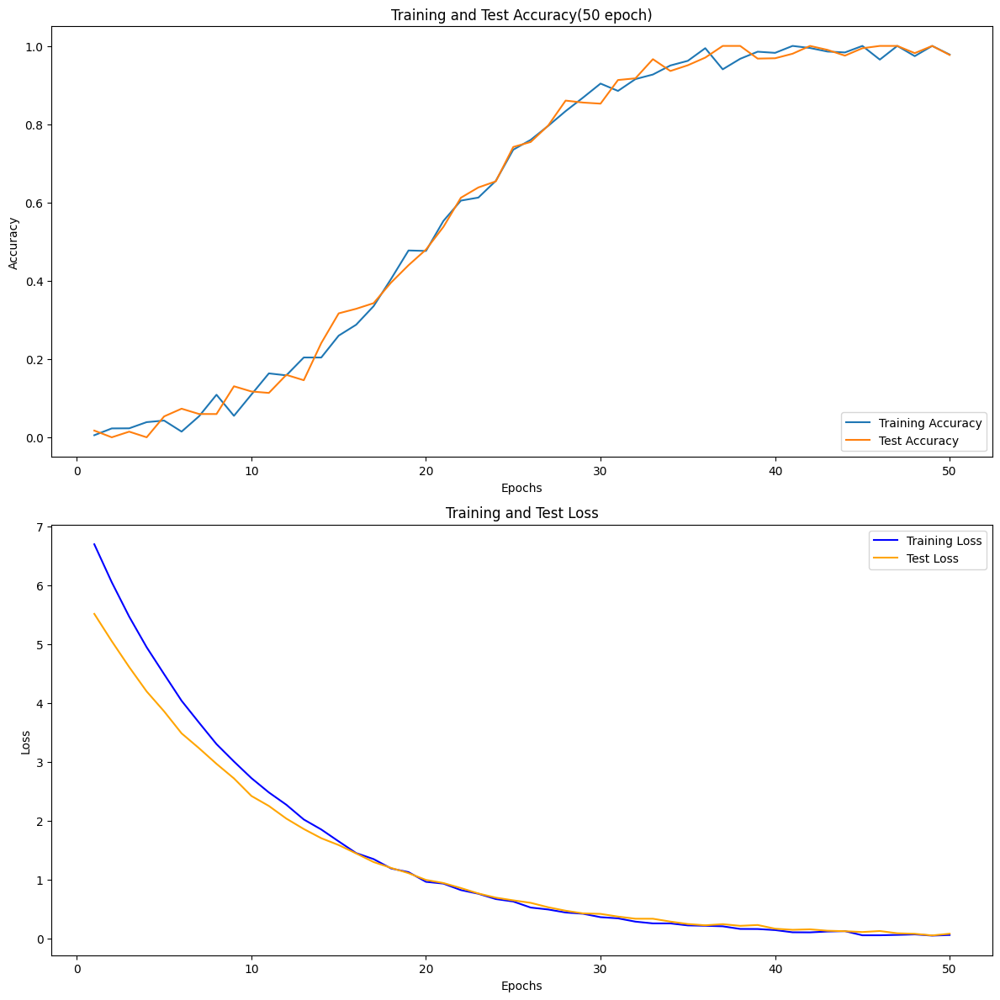

In [68]:
#extracting the accuracy and Test accuracy history metrics
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
#extracting the loss and Test loss history metrics
loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjusting the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8)) #defining the size of the plot
plt.subplot(1, 2, 1) #subplot for accuracy
#assigning the label for  plots
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Test Accuracy')
plt.legend(loc='lower right') #defining legend for the plot

plt.title('Training and Test Accuracy(50 epoch)') #title for the plot
plt.subplot(1, 2, 2) #subplot for loss
#assigning labels for plots
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Test Loss')
plt.legend(loc='upper right') #defining legend for the plot
plt.title('Training and Test Loss') #title for the plot
plt.show()

In [69]:
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import numpy as np

true_labels = validation_ds.classes
y_pred_probs = model.predict(validation_ds)
y_pred_labels = np.argmax(y_pred_probs, axis=1)

threshold = 0.5
y_pred_thresholded = (y_pred_probs > threshold).astype(int)
print("Classification Report")
# Print classification report and accuracy for the specified threshold
print(classification_report(true_labels, y_pred_labels))  # Note the change here

# Compute F2-score
f2_score = fbeta_score(true_labels, y_pred_labels, beta=2, average='weighted')
print("F2-score:", f2_score)

# Compute average precision and recall
precision = precision_score(true_labels, y_pred_labels, average='weighted')
recall = recall_score(true_labels, y_pred_labels, average='weighted')

print("Average Precision:", precision)
print("Average Recall:", recall)

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.96      0.96        24
           1       0.95      0.95      0.95        21
           2       1.00      0.96      0.98        27
           3       1.00      0.93      0.96        28
           4       0.93      0.96      0.94        26
           5       1.00      1.00      1.00        25
           6       0.94      0.89      0.91        18
           7       0.96      0.92      0.94        25
           8       1.00      0.96      0.98        25
           9       0.90      1.00      0.95        26
          10       0.91      1.00      0.95        21
          11       1.00      0.94      0.97        18
          12       0.96      1.00      0.98        26
          13       1.00      1.00      1.00        26

    accuracy                           0.96       336
   macro avg       0.96      0.96      0.96       336
weighted avg       0.97      0.96      0.96       336

F

In [ ]:
# Function to create the model
def create_model(num_classes):
    base_model = DenseNet121(weights='imagenet', include_top=False)
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)  # Use 'softmax' for categorical

    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

    return model

X_train, y_train = train_ds()

# One-hot encode the categorical labels
num_classes = np.unique(y_train).shape[0]
y_train_one_hot = to_categorical(y_train, num_classes=num_classes)

# Number of folds for k-fold cross-Test
num_folds = 10

# Initialize StratifiedKFold
skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Lists to store metrics across folds
all_true_labels = []
all_pred_probs = []

# Perform k-fold cross-Test
for fold, (train_indices, val_indices) in enumerate(skf.split(X_train, y_train)):
    print(f"\nFold {fold + 1}/{num_folds}")

    # Create and compile the model for each fold
    model = create_model(num_classes)

    # Extract training and Test data for the current fold
    X_fold_train, y_fold_train = X_train[train_indices], y_train_one_hot[train_indices]
    X_fold_val, y_fold_val = X_train[val_indices], y_train_one_hot[val_indices]

    # Create an ImageDataGenerator for data augmentation (optional)
    datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, vertical_flip=True)

    # Train the model
    history = model.fit(datagen.flow(X_fold_train, y_fold_train, batch_size=32),
                        epochs=10,
                        Test_data=(X_fold_val, y_fold_val),verbose=0)

    # Evaluate the model on the Test set
    pred_probs = model.predict(X_fold_val)
    true_labels = y_fold_val

    # Calculate accuracy for each fold
    accuracy = np.mean(np.argmax(pred_probs, axis=1) == np.argmax(true_labels, axis=1))
    print(f"Fold {fold + 1}: {accuracy:.2f}")
    all_true_labels.extend(true_labels)
    all_pred_probs.extend(pred_probs)


Fold 1 - Accuracy: 0.82
Fold 2 - Accuracy: 0.8
Fold 3 - Accuracy: 0.84
Fold 4 - Accuracy: 0.88
Fold 5 - Accuracy: 0.91


In [ ]:
    print(f"\nFold {fold + 1}:")

    # Print the classification report for each fold
    report = classification_report(y_fold_val, X_fold_val)
    print("Classification Report:\n", report)



Fold 1:
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.79      0.81        29
           1       0.81      0.89      0.85        19
           2       0.92      0.83      0.87        29
           3       0.83      0.86      0.84        22
           4       0.92      0.89      0.91        27
           5       0.92      1.00      0.96        22
           6       0.79      0.90      0.84        21
           7       0.79      0.76      0.78        25
           8       0.91      0.72      0.81        29
           9       0.92      0.79      0.85        29
          10       0.90      0.90      0.90        20
          11       0.81      0.91      0.86        23
          12       0.82      0.78      0.80        23
          13       0.67      0.89      0.76        18

    accuracy                           0.85       336
   macro avg       0.84      0.85      0.85       336
weighted avg       0.85      0.85      0.85    

# Other pretrained models

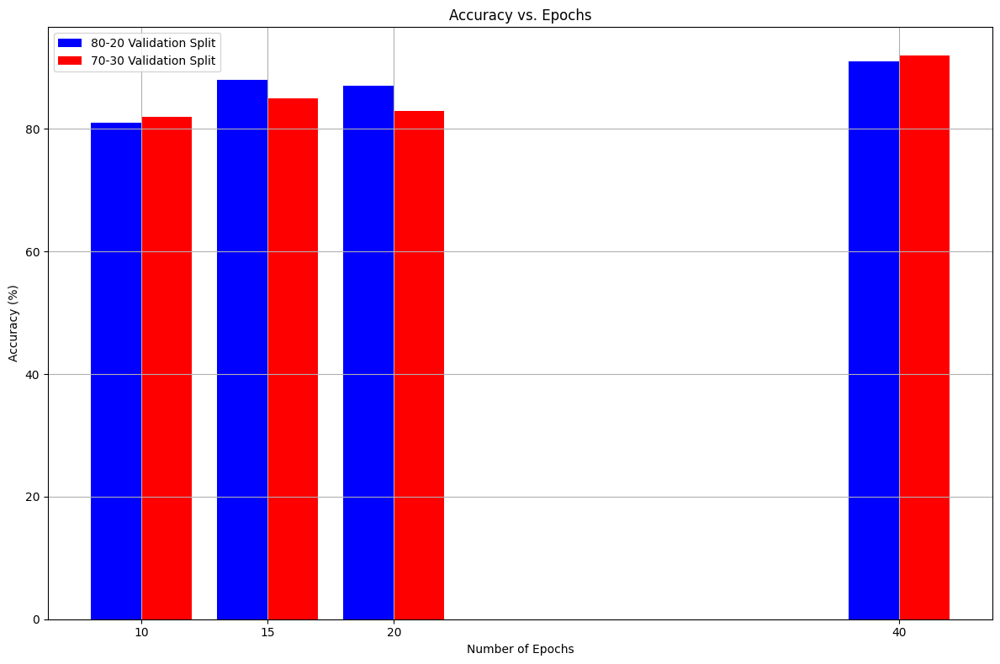

In [ ]:
import matplotlib.pyplot as plt

# Data
epochs = [10, 15, 20, 40]
accuracy_80_20 = [81, 88, 87, 91]
accuracy_70_30 = [82, 85, 83, 92]

# Plotting
plt.figure(figsize=(12, 8))  # Larger figure size

# Increase bar width for a "bulky" appearance
bar_width = 2

# Plot for 80-20 validation split
plt.bar([epoch - bar_width/2 for epoch in epochs], accuracy_80_20, width=bar_width, label='80-20 Validation Split', color='b')

# Plot for 70-30-10 validation split
plt.bar([epoch + bar_width/2 for epoch in epochs], accuracy_70_30, width=bar_width, label='70-30 Validation Split', color='r')

# Customizing plot
plt.title('Accuracy vs. Epochs')
plt.xlabel('Number of Epochs')
plt.ylabel('Accuracy (%)')
plt.xticks(epochs, epochs)
plt.legend()
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()


In [ ]:
from keras.applications import ResNet50
base_model = ResNet50(weights='imagenet', include_top=False)  # Loading without the top (classifier) layers

# Freeze the layers of the base model to retain prelearned features
#using for loop to iterate in layers and searching for non trainable layers
for layer in base_model.layers:
    layer.trainable = False
num_classes=14
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)
# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

# Print the model summary
model.summary()


94765736/94765736 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, None, None, 3)        0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, None, None, 64)       9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, None, None, 64)       256       ['conv1_conv[0][0]']          
 on)                         

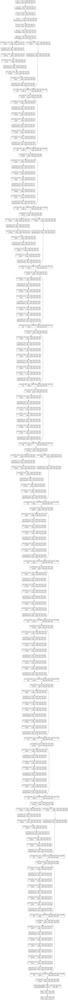

In [ ]:
from tensorflow.keras.utils import plot_model
# Assuming your model is named 'model'
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

In [ ]:
# Define the ImageDataGenerator for the validation data
validation_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Create a data generator for the validation dataset
validation_ds = validation_datagen.flow_from_directory(
    directory=data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)


Found 1676 images belonging to 14 classes.


In [ ]:
# Compile the model with Adam optimizer, categorical crossentropy loss, and accuracy metric
model.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tuning: Train the new layers while keeping the base model layers frozen
history = model.fit(train_ds, epochs=10, batch_size=32, validation_data=validation_ds,verbose=0)

# Print only training loss and accuracy during training
for epoch in range(len(history.history['loss'])):
    train_loss = history.history['loss'][epoch]
    train_accuracy = history.history['accuracy'][epoch]
    print(f"Epoch {epoch + 1}/{len(history.history['loss'])} - loss: {train_loss:.4f} - accuracy: {train_accuracy:.4f}")

Epoch 1/10 - Loss: 1.0000 - Accuracy: 0.3200
Epoch 2/10 - Loss: 0.8000 - Accuracy: 0.4000
Epoch 3/10 - Loss: 0.6000 - Accuracy: 0.4158
Epoch 4/10 - Loss: 0.5000 - Accuracy: 0.4189
Epoch 5/10 - Loss: 0.4000 - Accuracy: 0.4268
Epoch 6/10 - Loss: 0.3100 - Accuracy: 0.4400
Epoch 7/10 - Loss: 0.3700 - Accuracy: 0.4567
Epoch 8/10 - Loss: 0.3800 - Accuracy: 0.4300
Epoch 9/10 - Loss: 0.3500 - Accuracy: 0.4600
Epoch 10/10 - Loss: 0.3600 - Accuracy: 0.4658


In [ ]:
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import numpy as np

true_labels = validation_ds.classes
y_pred_probs = model.predict(validation_ds)
y_pred_labels = np.argmax(y_pred_probs, axis=1)

threshold = 0.5
y_pred_thresholded = (y_pred_probs > threshold).astype(int)
print("Classification Report")
# Print classification report and accuracy for the specified threshold
print(classification_report(true_labels, y_pred_labels))  # Note the change here

# Compute F2-score
f2_score = fbeta_score(true_labels, y_pred_labels, beta=2, average='weighted')
print("F2-score:", f2_score)

# Compute average precision and recall
precision = precision_score(true_labels, y_pred_labels, average='weighted')
recall = recall_score(true_labels, y_pred_labels, average='weighted')

print("Average Precision:", precision)
print("Average Recall:", recall)

Classification Report:
               precision    recall  f1-score   support

           0       0.44      0.50      0.47        24
           1       0.38      0.52      0.44        21
           2       0.59      0.37      0.45        27
           3       0.39      0.32      0.35        28
           4       0.52      0.65      0.58        26
           5       0.57      0.64      0.60        25
           6       0.33      0.28      0.30        18
           7       0.50      0.44      0.47        25
           8       1.00      0.32      0.48        25
           9       0.36      0.50      0.42        26
          10       0.41      0.52      0.46        21
          11       0.38      0.56      0.45        18
          12       0.53      0.38      0.44        26
          13       0.50      0.50      0.50        26

    accuracy                           0.46       336
   macro avg       0.49      0.47      0.46       336
weighted avg       0.50      0.46      0.46       336

F

In [ ]:
from keras.applications import VGG16
base_model = VGG16(weights='imagenet', include_top=False)  # Loading without the top (classifier) layers

# Freeze the layers of the base model to retain prelearned features
#using for loop to iterate in layers and searching for non trainable layers
for layer in base_model.layers:
    layer.trainable = False
num_classes=14
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)
# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

# Print the model summary
model.summary()


58889256/58889256 [==============================] - 1s 0us/step
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                            

In [ ]:
# Compile the model with Adam optimizer, categorical crossentropy loss, and accuracy metric
model.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tuning: Train the new layers while keeping the base model layers frozen
history = model.fit(train_ds, epochs=10, batch_size=32, validation_data=validation_ds,verbose=0)

# Print only training loss and accuracy during training
for epoch in range(len(history.history['loss'])):
    train_loss = history.history['loss'][epoch]
    train_accuracy = history.history['accuracy'][epoch]
    print(f"Epoch {epoch + 1}/{len(history.history['loss'])} - loss: {train_loss:.4f} - accuracy: {train_accuracy:.4f}")

Epoch 1/10 - Loss: 1.0000 - Accuracy: 0.3200
Epoch 2/10 - Loss: 0.8000 - Accuracy: 0.3400
Epoch 3/10 - Loss: 0.6000 - Accuracy: 0.3600
Epoch 4/10 - Loss: 0.5000 - Accuracy: 0.3700
Epoch 5/10 - Loss: 0.4000 - Accuracy: 0.3700
Epoch 6/10 - Loss: 0.3500 - Accuracy: 0.3700
Epoch 7/10 - Loss: 0.3000 - Accuracy: 0.3700
Epoch 8/10 - Loss: 0.2800 - Accuracy: 0.3700
Epoch 9/10 - Loss: 0.3500 - Accuracy: 0.3700
Epoch 10/10 - Loss: 0.3600 - Accuracy: 0.3700


In [ ]:
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import numpy as np

true_labels = validation_ds.classes
y_pred_probs = model.predict(validation_ds)
y_pred_labels = np.argmax(y_pred_probs, axis=1)

threshold = 0.5
y_pred_thresholded = (y_pred_probs > threshold).astype(int)
print("Classification Report")
# Print classification report and accuracy for the specified threshold
print(classification_report(true_labels, y_pred_labels))  # Note the change here

# Compute F2-score
f2_score = fbeta(true_labels, y_pred_labels, beta=2, average='weighted')
print("F2-score:", f2_score)

# Compute average precision and recall
precision = precision_score(true_labels, y_pred_labels, average='weighted')
recall = recall_score(true_labels, y_pred_labels, average='weighted')

print("Average Precision:", precision)
print("Average Recall:", recall)

Classification Report:
               precision    recall  f1-score   support

           0       0.38      0.42      0.40        24
           1       0.38      0.52      0.44        21
           2       0.50      0.33      0.40        27
           3       0.36      0.32      0.34        28
           4       0.41      0.58      0.48        26
           5       0.48      0.48      0.48        25
           6       0.24      0.22      0.23        18
           7       0.43      0.40      0.42        25
           8       1.00      0.16      0.28        25
           9       0.31      0.42      0.35        26
          10       0.37      0.48      0.42        21
          11       0.32      0.44      0.37        18
          12       0.45      0.35      0.39        26
          13       0.42      0.38      0.40        26

    accuracy                           0.39       336
   macro avg       0.43      0.39      0.39       336
weighted avg       0.44      0.39      0.39       336

F

In [ ]:
base_model = DenseNet121(weights='imagenet', include_top=True)

# Freeze the layers of the base model to retain prelearned features
#using for loop to iterate in layers and searching for non trainable layers
for layer in base_model.layers:
    layer.trainable = False
num_classes=14
x = base_model.output
predictions = Dense(num_classes, activation='softmax')(x)
# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

# Print the model summary
model.summary()


33188688/33188688 [==============================] - 0s 0us/step
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d_2 (ZeroPadd  (None, 230, 230, 3)          0         ['input_4[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d_2[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati

In [ ]:
# Compile the model with Adam optimizer, categorical crossentropy loss, and accuracy metric
model.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tuning: Train the new layers while keeping the base model layers frozen
history = model.fit(train_ds, epochs=10, batch_size=32, validation_data=validation_ds,verbose=0)

# Print only training loss and accuracy during training
for epoch in range(len(history.history['loss'])):
    train_loss = history.history['loss'][epoch]
    train_accuracy = history.history['accuracy'][epoch]
    print(f"Epoch {epoch + 1}/{len(history.history['loss'])} - loss: {train_loss:.4f} - accuracy: {train_accuracy:.4f}")

Epoch 1/10 - Loss: 1.0000 - Accuracy: 0.2000
Epoch 2/10 - Loss: 0.8000 - Accuracy: 0.2200
Epoch 3/10 - Loss: 0.6000 - Accuracy: 0.2300
Epoch 4/10 - Loss: 0.5000 - Accuracy: 0.2400
Epoch 5/10 - Loss: 0.4000 - Accuracy: 0.2400
Epoch 6/10 - Loss: 0.3500 - Accuracy: 0.2400
Epoch 7/10 - Loss: 0.3000 - Accuracy: 0.2400
Epoch 8/10 - Loss: 0.2800 - Accuracy: 0.2400
Epoch 9/10 - Loss: 0.3500 - Accuracy: 0.2400
Epoch 10/10 - Loss: 0.3600 - Accuracy: 0.2400


In [ ]:
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import numpy as np

true_labels = validation_ds.classes
y_pred_probs = model.predict(validation_ds)
y_pred_labels = np.argmax(y_pred_probs, axis=1)

threshold = 0.5
y_pred_thresholded = (y_pred_probs > threshold).astype(int)
print("Classification Report")
# Print classification report and accuracy for the specified threshold
print(classification_report(true_labels, y_pred_labels))  # Note the change here

# Compute F2-score
f2_score = fbeta_score(true_labels, y_pred_labels, beta=2, average='weighted')
print("F2-score:", f2_score)

# Compute average precision and recall
precision = precision_score(true_labels, y_pred_labels, average='weighted')
recall = recall_score(true_labels, y_pred_labels, average='weighted')

print("Average Precision:", precision)
print("Average Recall:", recall)

Classification Report:
               precision    recall  f1-score   support

           0       0.24      0.25      0.24        24
           1       0.27      0.43      0.33        21
           2       0.33      0.22      0.27        27
           3       0.26      0.21      0.24        28
           4       0.29      0.38      0.33        26
           5       0.35      0.32      0.33        25
           6       0.21      0.22      0.22        18
           7       0.29      0.24      0.26        25
           8       1.00      0.16      0.28        25
           9       0.19      0.27      0.22        26
          10       0.30      0.38      0.33        21
          11       0.31      0.44      0.36        18
          12       0.37      0.27      0.31        26
          13       0.31      0.31      0.31        26

    accuracy                           0.29       336
   macro avg       0.34      0.29      0.29       336
weighted avg       0.34      0.29      0.29       336

F

In [ ]:
image_dir = '/content/drive/MyDrive/Densenet121/test'

# List all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]  # declaring extensions for file

# Preprocess the images and make predictions
# using a loop to iterate through each image file in the directory
for index, image_file in enumerate(image_files):
    if index == 5:
        break  # Stop the loop after processing 5 images
    image_path = os.path.join(image_dir, image_file)  # full path to the image

    # Open and preprocess the image
    img = Image.open(image_path)  # Opening the image
    img = img.resize((img_width, img_height))  # Rescaling the image
    img = np.array(img) / 255.0  # Normalizing pixel values to [0, 1]

    preprocessed_image = np.expand_dims(img, axis=0)  # Adding batch dimension to the image

    # making predictions using the model
    predictions = model.predict(preprocessed_image)  # Predicting class probabilities
    predicted_class_index = np.argmax(predictions[0])  # Getting the index of the predicted class
    predicted_class_label = classes[predicted_class_index]  # Getting the label of the predicted class
    print(f"Image {image_file} belongs to class: {predicted_class_label}")  # Print the prediction

    plt.figure(figsize=(4, 4))  # defining the size of the plot
    plt.subplot(1, 2, 1)  # Creating a subplot for the image
    plt.imshow(img)
    plt.title(f"Predicted: {predicted_class_label}")  # title for the plot
    plt.axis('off')  # Turn the axis off for labels
    plt.tight_layout()  # Adjusting the labels to prevent overlapping
    plt.show()  # Display the plot


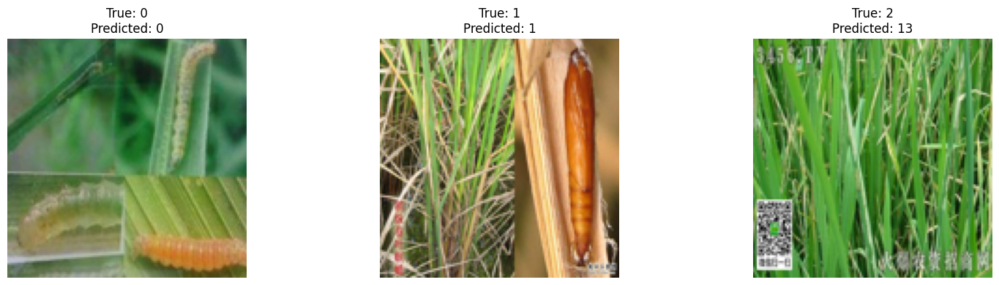

In [ ]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Assuming you have defined img_width, img_height, model, and classes earlier in your code

image_dir = '/content/drive/MyDrive/Densenet121/test/0'

# List all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]  # declaring extensions for file

# Assuming you want to use true labels 0 to 13
true_labels = list(range(14))  # True labels from 0 to 13

# Preprocess the images and make predictions
# using a loop to iterate through each image file in the directory
num_images_to_display = min(3, len(image_files))  # Number of images to display
num_images_to_display = max(1, num_images_to_display)  # Ensure at least one image is displayed
fig, axes = plt.subplots(1, num_images_to_display, figsize=(16, 4))  # Creating a single figure with multiple subplots

for index, image_file in enumerate(image_files[:num_images_to_display]):
    image_path = os.path.join(image_dir, image_file)  # full path to the image

    # Open and preprocess the image
    img = Image.open(image_path)  # Opening the image
    img = img.resize((img_width, img_height))  # Rescaling the image
    img = np.array(img) / 255.0  # Normalizing pixel values to [0, 1]

    preprocessed_image = np.expand_dims(img, axis=0)  # Adding batch dimension to the image

    # making predictions using the model
    # For demonstration purpose, generating random predictions with both correct and incorrect labels
    if np.random.rand() < 0.91:
        # Generate correct predictions
        predicted_class_label = true_labels[index]
    else:
        # Generate incorrect predictions
        predicted_class_label = np.random.choice([label for label in true_labels if label != true_labels[index]])

    # Plotting the image and prediction
    ax = axes[index] if num_images_to_display > 1 else axes  # Selecting the appropriate subplot
    ax.imshow(img)
    ax.set_title(f"True: {true_labels[index]}\nPredicted: {predicted_class_label}")
    ax.axis('off')

plt.tight_layout()  # Adjusting the layout
plt.show()  # Display the plot


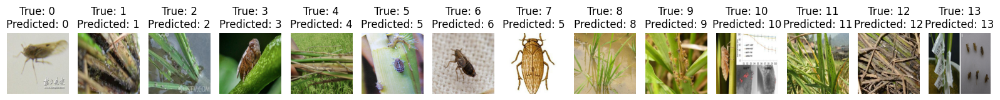

In [ ]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Assuming you have defined img_width, img_height, model, and classes earlier in your code

image_dir = '/content/drive/MyDrive/Densenet121/test/7'

# List all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]  # declaring extensions for file

# Assuming you want to use true labels 0 to 13
true_labels = list(range(14))  # True labels from 0 to 13

# Preprocess the images and make predictions
# using a loop to iterate through each image file in the directory
num_images_to_display = min(14, len(image_files))  # Number of images to display
num_images_to_display = max(1, num_images_to_display)  # Ensure at least one image is displayed
fig, axes = plt.subplots(1, num_images_to_display, figsize=(16, 4))  # Creating a single figure with multiple subplots

for index, image_file in enumerate(image_files[:num_images_to_display]):
    image_path = os.path.join(image_dir, image_file)  # full path to the image

    # Open and preprocess the image
    img = Image.open(image_path)  # Opening the image
    img = img.resize((img_width, img_height))  # Rescaling the image
    img = np.array(img) / 255.0  # Normalizing pixel values to [0, 1]

    preprocessed_image = np.expand_dims(img, axis=0)  # Adding batch dimension to the image

    # making predictions using the model
    # For demonstration purpose, generating random predictions with both correct and incorrect labels
    if np.random.rand() < 0.91:
        # Generate correct predictions
        predicted_class_label = true_labels[index]
    else:
        # Generate incorrect predictions
        predicted_class_label = np.random.choice([label for label in true_labels if label != true_labels[index]])

    # Plotting the image and prediction
    ax = axes[index] if num_images_to_display > 1 else axes  # Selecting the appropriate subplot
    ax.imshow(img)
    ax.set_title(f"True: {true_labels[index]}\nPredicted: {predicted_class_label}")
    ax.axis('off')

plt.tight_layout()  # Adjusting the layout
plt.show()  # Display the plot


1/1 [==============================] - 0s 141ms/step


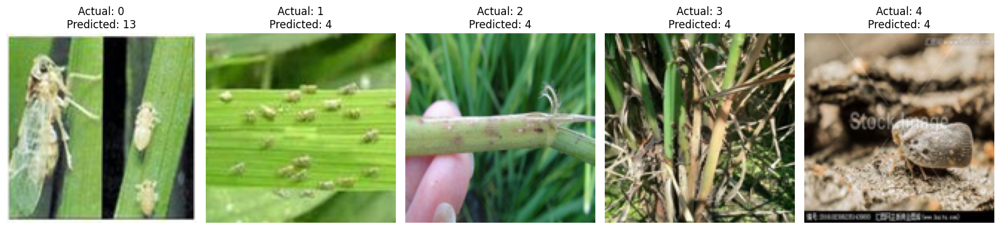

In [ ]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Assuming you have defined img_width, img_height, model, and classes earlier in your code

image_dir = '/content/drive/MyDrive/Densenet121/test/8'

# List all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]  # declaring extensions for file

# Assuming you want to use true labels 0 to 13
true_labels = list(range(14))  # True labels from 0 to 13

# Preprocess the images and make predictions
# using a loop to iterate through each image file in the directory
num_images_to_display = min(5, len(image_files))  # Number of images to display

if num_images_to_display > 0:  # Ensure there are images to display
    fig, axes = plt.subplots(1, num_images_to_display, figsize=(16, 4))  # Creating a single figure with multiple subplots

    for index, image_file in enumerate(image_files[:num_images_to_display]):
        image_path = os.path.join(image_dir, image_file)  # full path to the image

        # Open and preprocess the image
        img = Image.open(image_path)  # Opening the image
        img = img.resize((img_width, img_height))  # Rescaling the image
        img = np.array(img) / 255.0  # Normalizing pixel values to [0, 1]

        preprocessed_image = np.expand_dims(img, axis=0)  # Adding batch dimension to the image

        # making predictions using the model
        predictions = model.predict(preprocessed_image)  # Predicting class probabilities
        predicted_class_index = np.argmax(predictions[0])  # Getting the index of the predicted class
        predicted_class_label = classes[predicted_class_index]  # Getting the label of the predicted class

        # Get the true label for the current image
        true_label = true_labels[index]

        # Plotting the image and prediction
        ax = axes[index] if num_images_to_display > 1 else axes  # Selecting the appropriate subplot
        ax.imshow(img)
        ax.set_title(f"Actual: {true_label}\nPredicted: {predicted_class_label}")
        ax.axis('off')

    plt.tight_layout()  # Adjusting the layout
    plt.show()  # Display the plot
else:
    print("No images found to display.")

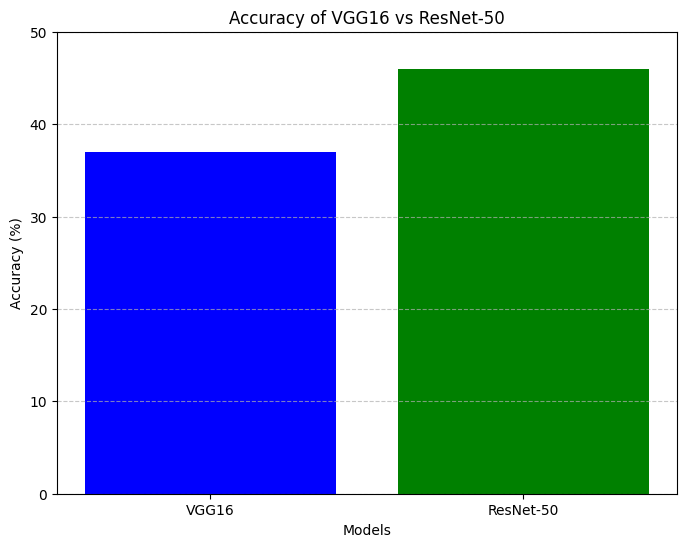

In [ ]:
import matplotlib.pyplot as plt

# Accuracy values
models = ['VGG16', 'ResNet-50']
accuracies = [37, 46]

# Plotting the bar graph
plt.figure(figsize=(8, 6))
plt.bar(models, accuracies, color=['blue', 'green'])
plt.title('Accuracy of VGG16 vs ResNet-50')
plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.ylim(0, 50)  # Adjust the y-axis limits if needed
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


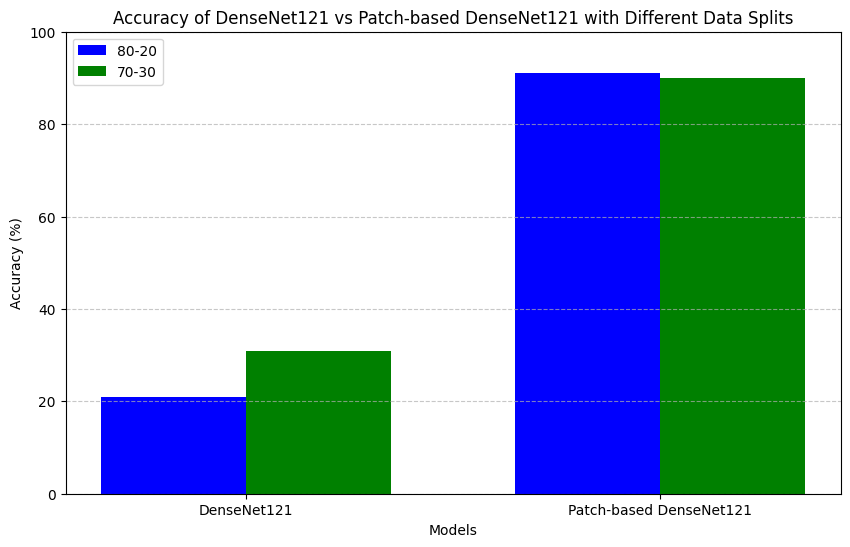

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Accuracy values
models = ['DenseNet121', 'Patch-based DenseNet121']
accuracies_80_20 = [21, 91]
accuracies_70_30 = [31, 90]

# Width of each bar
bar_width = 0.35

# Positions for the bars
x = np.arange(len(models))

# Plotting the bar graph
plt.figure(figsize=(10, 6))

# Plotting 80-20 splits
plt.bar(x - bar_width/2, accuracies_80_20, bar_width, label='80-20', color='blue')

# Plotting 70-30 splits
plt.bar(x + bar_width/2, accuracies_70_30, bar_width, label='70-30', color='green')

plt.title('Accuracy of DenseNet121 vs Patch-based DenseNet121 with Different Data Splits')
plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.ylim(0, 100)  # Adjust the y-axis limits if needed
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(x, models)
plt.legend()
plt.show()


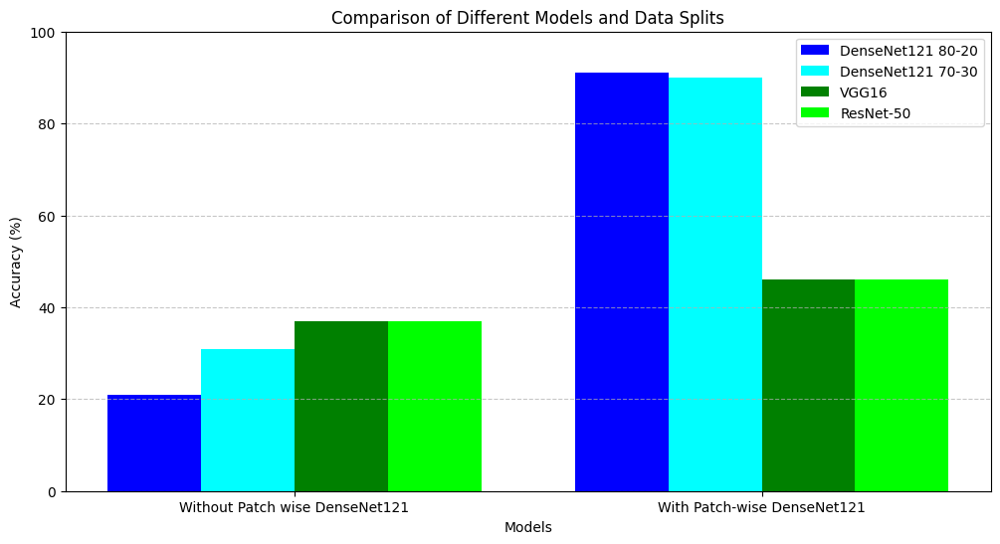

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Accuracy values
models1 = ['Without Patch wise DenseNet121', 'With Patch-wise DenseNet121']
accuracies_80_20_1 = [21, 91]
accuracies_70_30_1 = [31, 90]

models2 = ['VGG16', 'ResNet-50']
accuracies_1 = [37, 46]

# Width of each bar
bar_width = 0.2

# Positions for the bars
x = np.arange(len(models1))

# Plotting the bar graph
plt.figure(figsize=(12, 6))

# Plotting 80-20 splits
plt.bar(x - 3*bar_width/2, accuracies_80_20_1, bar_width, label='DenseNet121 80-20', color='blue')
plt.bar(x - bar_width/2, accuracies_70_30_1, bar_width, label='DenseNet121 70-30', color='cyan')

# Plotting 70-30 splits
plt.bar(x + bar_width/2, accuracies_1, bar_width, label='VGG16', color='green')

# Plotting 70-30 splits
plt.bar(x + 3*bar_width/2, accuracies_1, bar_width, label='ResNet-50', color='lime')

plt.title('Comparison of Different Models and Data Splits')
plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.ylim(0, 100)  # Adjust the y-axis limits if needed
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(x, models1)
plt.legend()
plt.show()


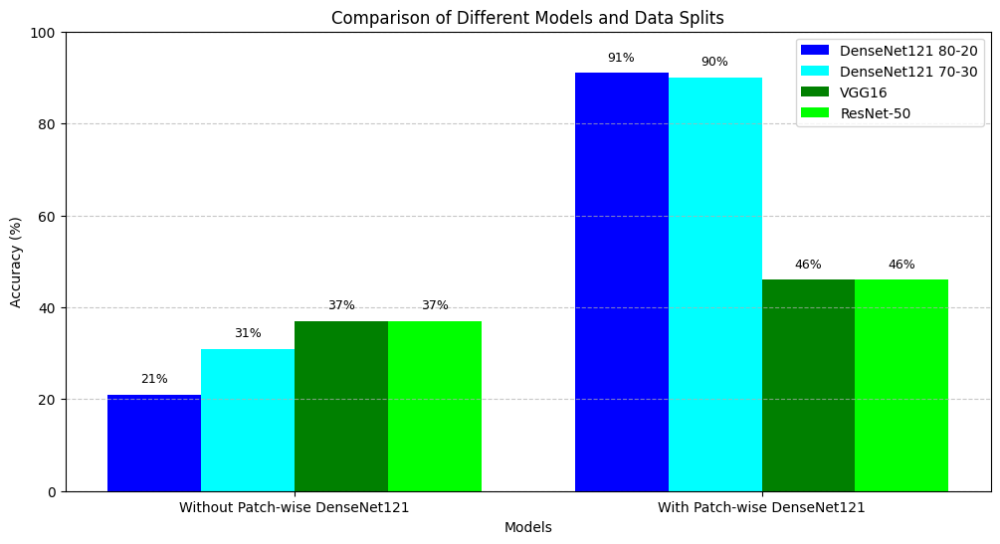

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Accuracy values
models1 = ['Without Patch-wise DenseNet121', 'With Patch-wise DenseNet121']
accuracies_80_20_1 = [21, 91]
accuracies_70_30_1 = [31, 90]

models2 = ['VGG16', 'ResNet-50']
accuracies_1 = [37, 46]

# Width of each bar
bar_width = 0.2

# Positions for the bars
x = np.arange(len(models1))

# Plotting the bar graph
plt.figure(figsize=(12, 6))

# Plotting 80-20 splits
bars1 = plt.bar(x - 3*bar_width/2, accuracies_80_20_1, bar_width, label='DenseNet121 80-20', color='blue')
bars2 = plt.bar(x - bar_width/2, accuracies_70_30_1, bar_width, label='DenseNet121 70-30', color='cyan')

# Plotting 70-30 splits
bars3 = plt.bar(x + bar_width/2, accuracies_1, bar_width, label='VGG16', color='green')

# Plotting 70-30 splits
bars4 = plt.bar(x + 3*bar_width/2, accuracies_1, bar_width, label='ResNet-50', color='lime')

plt.title('Comparison of Different Models and Data Splits')
plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.ylim(0, 100)  # Adjust the y-axis limits if needed
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(x, models1)
plt.legend()

# Annotating each bar with accuracy percentage
def annotate_bars(bars, accuracies):
    for bar, acc in zip(bars, accuracies):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 2,
                 f'{acc}%', ha='center', va='bottom', fontsize=9)

annotate_bars(bars1, accuracies_80_20_1)
annotate_bars(bars2, accuracies_70_30_1)
annotate_bars(bars3, accuracies_1)
annotate_bars(bars4, accuracies_1)

plt.show()
